In [1]:
import os
import random
import numpy as np
import tensorflow as tf
import rasterio
import wandb


from wandb.integration.keras import WandbMetricsLogger, WandbModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
wandb.init(
    project="oil-spill-detection",
    name="CNN-6Conv-32Filters-512x512",
    config={
        "input_shape": (512, 512, 2),
        "conv_layers": 6,
        "filters": 32,
        "kernel_size": (3, 3),
        "pool_size": (2, 2),
        "dense_units": [20, 20],
        "activation": "relu",
        "optimizer": "Adam",
        "loss": "binary_crossentropy",
        "epochs": 50,
        "batch_size": 8
    }
)

In [2]:
IMG_SIZE = (512, 512)
BATCH_SIZE = 8
EPOCHS = 5
SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# BASE_PATH = "/Volumes/Windows8_OS/Dataset/Dataset-OG"
BASE_PATH = r"C:\FinalYear\Dataset-OG"

TRAIN_IMG_DIR = os.path.join(BASE_PATH, "Train", "Images")
TEST_IMG_DIR  = os.path.join(BASE_PATH, "Test", "Images")  # if exists

In [3]:
def load_sar_tiff(path):
    def _read(p):
        with rasterio.open(p.decode()) as src:
            vv = src.read(1).astype(np.float32)
            vh = src.read(2).astype(np.float32)

        vv = np.clip(vv, -35, 5)
        vh = np.clip(vh, -40, 0)

        vv = (vv + 35) / 40
        vh = (vh + 40) / 40

        img = np.stack([vv, vh], axis=-1)
        img = tf.image.resize(img, IMG_SIZE).numpy()
        return img

    img = tf.numpy_function(_read, [path], tf.float32)
    img.set_shape([512, 512, 2])
    return img

In [4]:
def augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)

    k = tf.random.uniform([], 0, 4, dtype=tf.int32)
    image = tf.image.rot90(image, k)

    tx = tf.random.uniform([], -0.05, 0.05)
    ty = tf.random.uniform([], -0.05, 0.05)

    image = tf.roll(
        image,
        shift=[
            tf.cast(tx * IMG_SIZE[0], tf.int32),
            tf.cast(ty * IMG_SIZE[1], tf.int32)
        ],
        axis=[0, 1]
    )

    return image, label

In [ ]:
def build_balanced_dataset(images_root, target_per_class=1200):
    oil_dir = os.path.join(images_root, "Oil")
    no_oil_dir = os.path.join(images_root, "No_Oil")
    lookalike_dir = os.path.join(images_root, "Lookalike")

    oil_files = sorted([os.path.join(oil_dir, f) for f in os.listdir(oil_dir) if f.endswith(".tif")])
    no_oil_files = sorted([os.path.join(no_oil_dir, f) for f in os.listdir(no_oil_dir) if f.endswith(".tif")])
    lookalike_files = sorted([os.path.join(lookalike_dir, f) for f in os.listdir(lookalike_dir) if f.endswith(".tif")])

    combined_no_oil = no_oil_files + lookalike_files
    random.shuffle(combined_no_oil)

    oil_files = oil_files[:target_per_class]
    combined_no_oil = combined_no_oil[:target_per_class]

    paths = oil_files + combined_no_oil
    labels = [1]*len(oil_files) + [0]*len(combined_no_oil)

    return np.array(paths), np.array(labels)


In [6]:
def build_test_dataset(images_root):
    oil_dir = os.path.join(images_root, "Oil")
    no_oil_dir = os.path.join(images_root, "No_Oil")
    lookalike_dir = os.path.join(images_root, "Lookalike")

    oil_files = [os.path.join(oil_dir, f) for f in os.listdir(oil_dir) if f.endswith(".tif")]
    no_oil_files = [os.path.join(no_oil_dir, f) for f in os.listdir(no_oil_dir) if f.endswith(".tif")]
    lookalike_files = [os.path.join(lookalike_dir, f) for f in os.listdir(lookalike_dir) if f.endswith(".tif")]

    paths = oil_files + no_oil_files + lookalike_files
    labels = (
        [1] * len(oil_files) +
        [0] * len(no_oil_files) +
        [0] * len(lookalike_files)
    )

    return np.array(paths), np.array(labels)

In [7]:
from sklearn.model_selection import train_test_split

all_paths, all_labels = build_balanced_dataset(TRAIN_IMG_DIR)

print("Total balanced samples:", len(all_paths))

Total balanced samples: 2400


In [8]:
train_paths, val_paths, train_labels, val_labels = train_test_split(
    all_paths,
    all_labels,
    train_size=0.66,
    stratify=all_labels,
    random_state=SEED
)

print("Train samples:", len(train_paths))
print("Val samples:", len(val_paths))

print("Train Oil:", np.sum(train_labels == 1))
print("Train No_Oil:", np.sum(train_labels == 0))
print("Val Oil:", np.sum(val_labels == 1))
print("Val No_Oil:", np.sum(val_labels == 0))

Train samples: 1584
Val samples: 816
Train Oil: 792
Train No_Oil: 792
Val Oil: 408
Val No_Oil: 408


In [9]:
test_paths, test_labels = build_test_dataset(TEST_IMG_DIR)

print("Test samples:", len(test_paths))  # 450
print("Test Oil:", np.sum(test_labels == 1))        # 150
print("Test No_Oil:", np.sum(test_labels == 0))     # 300

Test samples: 450
Test Oil: 150
Test No_Oil: 300


In [10]:
def make_dataset(paths, labels, augment_fn=None, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))

    if shuffle:
        ds = ds.shuffle(
            buffer_size=len(paths),
            seed=SEED,
            reshuffle_each_iteration=True
        )

    ds = ds.map(
        lambda x, y: (load_sar_tiff(x), y),
        num_parallel_calls=1  # rasterio-safe
    )

    if augment_fn is not None:
        ds = ds.map(augment_fn, num_parallel_calls=1)

    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    return ds


In [11]:
train_ds = make_dataset(
    train_paths,
    train_labels,
    augment_fn=augment,
    shuffle=True
)

val_ds = make_dataset(
    val_paths,
    val_labels,
    augment_fn=None,
    shuffle=False
)

test_ds = make_dataset(
    test_paths,
    test_labels,
    augment_fn=None,
    shuffle=False
)

In [12]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

def build_cnn():
    model = Sequential()

    for i in range(6):
        if i == 0:
            model.add(Conv2D(
                filters=32,
                kernel_size=(3, 3),
                activation="relu",
                padding="same",
                input_shape=(512, 512, 2)
            ))
        else:
            model.add(Conv2D(
                filters=32,
                kernel_size=(3, 3),
                activation="relu",
                padding="same"
            ))

        model.add(MaxPooling2D(pool_size=(2, 2)))


    model.add(Flatten())

    model.add(Dense(20, activation="relu"))
    model.add(Dense(20, activation="relu"))

    model.add(Dense(1, activation="sigmoid"))

    model.compile(
        optimizer=tf.keras.optimizers.Adam(),
        loss="binary_crossentropy",
        metrics=["accuracy"]
    )

    return model

# Hold On

In [ ]:
MODEL_PATH   = "CNN/Models/latest.keras"
WEIGHTS_PATH = "CNN/Weights/weights_epoch_{epoch:03d}.weights.h5"

os.makedirs("CNN", exist_ok=True)

if os.path.exists(MODEL_PATH):
    print("🔁 Resuming training from saved model...")
    model = tf.keras.models.load_model(MODEL_PATH)
else:
    print("🆕 Starting training from scratch...")
    model = build_cnn()

early_stop = EarlyStopping(
    monitor="val_loss",
    patience=8,
    restore_best_weights=True
)

# Save FULL MODEL (for resume)
model_ckpt = tf.keras.callbacks.ModelCheckpoint(
    filepath=MODEL_PATH,
    save_best_only=False,
    verbose=1
)

# Save WEIGHTS separately (for analysis)
weights_ckpt = tf.keras.callbacks.ModelCheckpoint(
    filepath=WEIGHTS_PATH,
    save_weights_only=True,
    save_best_only=False,
    verbose=0
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[
        early_stop,
        model_ckpt,
        weights_ckpt,
        WandbMetricsLogger(log_freq="epoch")
    ]
)


# Continue

In [13]:
early_stop = EarlyStopping(
    monitor="val_loss",
    patience=8,
    restore_best_weights=True
)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath="CNN_checkpoints/model_epoch_{epoch}.weights.h5",
    save_weights_only=True,
    save_best_only=False
)

In [14]:
model = build_cnn()
#model.load_weights("CNN_checkpoints/model_epoch_10.weights.h5")

C:\Users\Sakshi\anaconda3\envs\torch_gpu\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [16]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    #initial_epoch=10,
    callbacks=[
        early_stop, 
        checkpoint_cb 
        #WandbMetricsLogger(log_freq="epoch")
    ]
)

Epoch 1/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 687s 3s/step - accuracy: 0.6496 - loss: 0.6413 - val_accuracy: 0.7230 - val_loss: 0.6270
Epoch 2/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 503s 3s/step - accuracy: 0.7222 - loss: 0.5735 - val_accuracy: 0.7194 - val_loss: 0.5369
Epoch 3/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 495s 3s/step - accuracy: 0.7134 - loss: 0.5650 - val_accuracy: 0.7365 - val_loss: 0.5177
Epoch 4/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 501s 3s/step - accuracy: 0.7361 - loss: 0.5184 - val_accuracy: 0.7635 - val_loss: 0.4294
Epoch 5/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 497s 3s/step - accuracy: 0.7803 - loss: 0.4894 - val_accuracy: 0.8922 - val_loss: 0.4325
Epoch 6/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 498s 3s/step - accuracy: 0.8630 - loss: 0.3712 - val_accuracy: 0.7794 - val_loss: 0.4511
Epoch 7/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 497s 3s/step - accuracy: 0.8939 - loss: 0.3272 - val_accuracy: 0.9118 - val_loss: 0.2538
Epoch 8/10
198/198 ━━━━━━━━━━━━━━━━━━━━ 498s 3s/step - accuracy: 0.9141 - loss: 0.2590 - val_accu

In [29]:
model.save("BestModel_23.keras")

In [25]:
model.load_weights("CNN_checkpoints/model_epoch_10.weights.h5")

In [26]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    initial_epoch=10,
    callbacks=[
        early_stop, 
        checkpoint_cb
    ]
)

Epoch 11/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 9:13 3s/step - accuracy: 0.8750 - loss: 0.3739

  2/198 ━━━━━━━━━━━━━━━━━━━━ 10:04 3s/step - accuracy: 0.9062 - loss: 0.2901

  3/198 ━━━━━━━━━━━━━━━━━━━━ 9:41 3s/step - accuracy: 0.9236 - loss: 0.2528 

  4/198 ━━━━━━━━━━━━━━━━━━━━ 9:28 3s/step - accuracy: 0.9349 - loss: 0.2305

  5/198 ━━━━━━━━━━━━━━━━━━━━ 9:34 3s/step - accuracy: 0.9429 - loss: 0.2128

  6/198 ━━━━━━━━━━━━━━━━━━━━ 9:09 3s/step - accuracy: 0.9490 - loss: 0.1986

  7/198 ━━━━━━━━━━━━━━━━━━━━ 9:04 3s/step - accuracy: 0.9537 - loss: 0.1876

  8/198 ━━━━━━━━━━━━━━━━━━━━ 9:12 3s/step - accuracy: 0.9556 - loss: 0.1810

  9/198 ━━━━━━━━━━━━━━━━━━━━ 9:13 3s/step - accuracy: 0.9574 - loss: 0.1754

 10/198 ━━━━━━━━━━━━━━━━━━━━ 9:09 3s/step - accuracy: 0.9567 - loss: 0.1732

 11/198 ━━━━━━━━━━━━━━━━━━━━ 9:10 3s/step - accuracy: 0.9565 - loss: 0.1713

 12/198 ━━━━━━━━━━━━━━━━━━━━ 9:12 3s/step - accuracy: 0.9566 - loss: 0.1691

 13/198 ━━━━━━━━━━━━━━━━━━━━ 9:07 3s/step - accuracy: 0.9563 - loss: 0.1676

 14/198 ━━━━━━━━━━━━━━━━━━━━ 8:59 3s/step - accuracy: 0.9556 - loss: 0.1668

 15/198 ━━━━━━━━━━━━━━━━━━━━ 8:56 3s/step - accuracy: 0.9552 - loss: 0.1659

 16/198 ━━━━━━━━━━━━━━━━━━━━ 8:55 3s/step - accuracy: 0.9551 - loss: 0.1647

 17/198 ━━━━━━━━━━━━━━━━━━━━ 8:53 3s/step - accuracy: 0.9547 - loss: 0.1642

 18/198 ━━━━━━━━━━━━━━━━━━━━ 8:53 3s/step - accuracy: 0.9545 - loss: 0.1632

 19/198 ━━━━━━━━━━━━━━━━━━━━ 8:45 3s/step - accuracy: 0.9545 - loss: 0.1624

 20/198 ━━━━━━━━━━━━━━━━━━━━ 8:39 3s/step - accuracy: 0.9546 - loss: 0.1616

 21/198 ━━━━━━━━━━━━━━━━━━━━ 8:31 3s/step - accuracy: 0.9542 - loss: 0.1617

 22/198 ━━━━━━━━━━━━━━━━━━━━ 8:24 3s/step - accuracy: 0.9539 - loss: 0.1616

 23/198 ━━━━━━━━━━━━━━━━━━━━ 8:18 3s/step - accuracy: 0.9538 - loss: 0.1612

 24/198 ━━━━━━━━━━━━━━━━━━━━ 8:12 3s/step - accuracy: 0.9538 - loss: 0.1607

 25/198 ━━━━━━━━━━━━━━━━━━━━ 8:07 3s/step - accuracy: 0.9538 - loss: 0.1601

 26/198 ━━━━━━━━━━━━━━━━━━━━ 8:04 3s/step - accuracy: 0.9539 - loss: 0.1594

 27/198 ━━━━━━━━━━━━━━━━━━━━ 8:00 3s/step - accuracy: 0.9534 - loss: 0.1597

 28/198 ━━━━━━━━━━━━━━━━━━━━ 7:54 3s/step - accuracy: 0.9530 - loss: 0.1598

 29/198 ━━━━━━━━━━━━━━━━━━━━ 7:49 3s/step - accuracy: 0.9524 - loss: 0.1610

 30/198 ━━━━━━━━━━━━━━━━━━━━ 7:49 3s/step - accuracy: 0.9519 - loss: 0.1619

 31/198 ━━━━━━━━━━━━━━━━━━━━ 7:46 3s/step - accuracy: 0.9512 - loss: 0.1631

 32/198 ━━━━━━━━━━━━━━━━━━━━ 7:44 3s/step - accuracy: 0.9507 - loss: 0.1641

 33/198 ━━━━━━━━━━━━━━━━━━━━ 7:42 3s/step - accuracy: 0.9500 - loss: 0.1655

 34/198 ━━━━━━━━━━━━━━━━━━━━ 7:39 3s/step - accuracy: 0.9493 - loss: 0.1670

 35/198 ━━━━━━━━━━━━━━━━━━━━ 7:39 3s/step - accuracy: 0.9487 - loss: 0.1682

 36/198 ━━━━━━━━━━━━━━━━━━━━ 7:39 3s/step - accuracy: 0.9481 - loss: 0.1695

 37/198 ━━━━━━━━━━━━━━━━━━━━ 7:37 3s/step - accuracy: 0.9476 - loss: 0.1706

 38/198 ━━━━━━━━━━━━━━━━━━━━ 7:36 3s/step - accuracy: 0.9472 - loss: 0.1716

 39/198 ━━━━━━━━━━━━━━━━━━━━ 7:34 3s/step - accuracy: 0.9467 - loss: 0.1727

 40/198 ━━━━━━━━━━━━━━━━━━━━ 7:35 3s/step - accuracy: 0.9463 - loss: 0.1735

 41/198 ━━━━━━━━━━━━━━━━━━━━ 7:33 3s/step - accuracy: 0.9460 - loss: 0.1743

 42/198 ━━━━━━━━━━━━━━━━━━━━ 7:29 3s/step - accuracy: 0.9457 - loss: 0.1750

 43/198 ━━━━━━━━━━━━━━━━━━━━ 7:28 3s/step - accuracy: 0.9454 - loss: 0.1757

 44/198 ━━━━━━━━━━━━━━━━━━━━ 7:27 3s/step - accuracy: 0.9451 - loss: 0.1764

 45/198 ━━━━━━━━━━━━━━━━━━━━ 7:25 3s/step - accuracy: 0.9449 - loss: 0.1770

 46/198 ━━━━━━━━━━━━━━━━━━━━ 7:22 3s/step - accuracy: 0.9446 - loss: 0.1775

 47/198 ━━━━━━━━━━━━━━━━━━━━ 7:17 3s/step - accuracy: 0.9444 - loss: 0.1781

 48/198 ━━━━━━━━━━━━━━━━━━━━ 7:13 3s/step - accuracy: 0.9442 - loss: 0.1785

 49/198 ━━━━━━━━━━━━━━━━━━━━ 7:10 3s/step - accuracy: 0.9440 - loss: 0.1790

 50/198 ━━━━━━━━━━━━━━━━━━━━ 7:06 3s/step - accuracy: 0.9439 - loss: 0.1794

 51/198 ━━━━━━━━━━━━━━━━━━━━ 7:01 3s/step - accuracy: 0.9438 - loss: 0.1798

 52/198 ━━━━━━━━━━━━━━━━━━━━ 6:57 3s/step - accuracy: 0.9436 - loss: 0.1802

 53/198 ━━━━━━━━━━━━━━━━━━━━ 6:54 3s/step - accuracy: 0.9435 - loss: 0.1806

 54/198 ━━━━━━━━━━━━━━━━━━━━ 6:53 3s/step - accuracy: 0.9434 - loss: 0.1809

 55/198 ━━━━━━━━━━━━━━━━━━━━ 6:49 3s/step - accuracy: 0.9433 - loss: 0.1812

 56/198 ━━━━━━━━━━━━━━━━━━━━ 6:45 3s/step - accuracy: 0.9432 - loss: 0.1814

 57/198 ━━━━━━━━━━━━━━━━━━━━ 6:42 3s/step - accuracy: 0.9432 - loss: 0.1815

 58/198 ━━━━━━━━━━━━━━━━━━━━ 6:38 3s/step - accuracy: 0.9431 - loss: 0.1817

 59/198 ━━━━━━━━━━━━━━━━━━━━ 6:34 3s/step - accuracy: 0.9430 - loss: 0.1818

 60/198 ━━━━━━━━━━━━━━━━━━━━ 6:30 3s/step - accuracy: 0.9430 - loss: 0.1819

 61/198 ━━━━━━━━━━━━━━━━━━━━ 6:27 3s/step - accuracy: 0.9429 - loss: 0.1821

 62/198 ━━━━━━━━━━━━━━━━━━━━ 6:23 3s/step - accuracy: 0.9428 - loss: 0.1822

 63/198 ━━━━━━━━━━━━━━━━━━━━ 6:19 3s/step - accuracy: 0.9427 - loss: 0.1823

 64/198 ━━━━━━━━━━━━━━━━━━━━ 6:16 3s/step - accuracy: 0.9426 - loss: 0.1825

 65/198 ━━━━━━━━━━━━━━━━━━━━ 6:12 3s/step - accuracy: 0.9425 - loss: 0.1826

 66/198 ━━━━━━━━━━━━━━━━━━━━ 6:08 3s/step - accuracy: 0.9424 - loss: 0.1827

 67/198 ━━━━━━━━━━━━━━━━━━━━ 6:04 3s/step - accuracy: 0.9424 - loss: 0.1828

 68/198 ━━━━━━━━━━━━━━━━━━━━ 6:00 3s/step - accuracy: 0.9423 - loss: 0.1828

 69/198 ━━━━━━━━━━━━━━━━━━━━ 5:57 3s/step - accuracy: 0.9423 - loss: 0.1829

 70/198 ━━━━━━━━━━━━━━━━━━━━ 5:54 3s/step - accuracy: 0.9423 - loss: 0.1828

 71/198 ━━━━━━━━━━━━━━━━━━━━ 5:50 3s/step - accuracy: 0.9422 - loss: 0.1829

 72/198 ━━━━━━━━━━━━━━━━━━━━ 5:47 3s/step - accuracy: 0.9422 - loss: 0.1829

 73/198 ━━━━━━━━━━━━━━━━━━━━ 5:43 3s/step - accuracy: 0.9421 - loss: 0.1829

 74/198 ━━━━━━━━━━━━━━━━━━━━ 5:40 3s/step - accuracy: 0.9421 - loss: 0.1829

 75/198 ━━━━━━━━━━━━━━━━━━━━ 5:36 3s/step - accuracy: 0.9420 - loss: 0.1829

 76/198 ━━━━━━━━━━━━━━━━━━━━ 5:33 3s/step - accuracy: 0.9420 - loss: 0.1829

 77/198 ━━━━━━━━━━━━━━━━━━━━ 5:30 3s/step - accuracy: 0.9420 - loss: 0.1829

 78/198 ━━━━━━━━━━━━━━━━━━━━ 5:26 3s/step - accuracy: 0.9419 - loss: 0.1829

 79/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 3s/step - accuracy: 0.9419 - loss: 0.1828

 80/198 ━━━━━━━━━━━━━━━━━━━━ 5:20 3s/step - accuracy: 0.9418 - loss: 0.1828

 81/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 3s/step - accuracy: 0.9418 - loss: 0.1827

 82/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 3s/step - accuracy: 0.9418 - loss: 0.1827

 83/198 ━━━━━━━━━━━━━━━━━━━━ 5:10 3s/step - accuracy: 0.9418 - loss: 0.1826

 84/198 ━━━━━━━━━━━━━━━━━━━━ 5:07 3s/step - accuracy: 0.9418 - loss: 0.1824

 85/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 3s/step - accuracy: 0.9418 - loss: 0.1823

 86/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 3s/step - accuracy: 0.9418 - loss: 0.1822

 87/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 3s/step - accuracy: 0.9418 - loss: 0.1820

 88/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 3s/step - accuracy: 0.9418 - loss: 0.1818

 89/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 3s/step - accuracy: 0.9418 - loss: 0.1817

 90/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 3s/step - accuracy: 0.9419 - loss: 0.1815

 91/198 ━━━━━━━━━━━━━━━━━━━━ 4:46 3s/step - accuracy: 0.9419 - loss: 0.1814

 92/198 ━━━━━━━━━━━━━━━━━━━━ 4:43 3s/step - accuracy: 0.9419 - loss: 0.1812

 93/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 3s/step - accuracy: 0.9419 - loss: 0.1810

 94/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 3s/step - accuracy: 0.9420 - loss: 0.1808

 95/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 3s/step - accuracy: 0.9420 - loss: 0.1806

 96/198 ━━━━━━━━━━━━━━━━━━━━ 4:32 3s/step - accuracy: 0.9421 - loss: 0.1804

 97/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 3s/step - accuracy: 0.9421 - loss: 0.1802

 98/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 3s/step - accuracy: 0.9422 - loss: 0.1800

 99/198 ━━━━━━━━━━━━━━━━━━━━ 4:23 3s/step - accuracy: 0.9422 - loss: 0.1798

100/198 ━━━━━━━━━━━━━━━━━━━━ 4:20 3s/step - accuracy: 0.9423 - loss: 0.1796

101/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 3s/step - accuracy: 0.9423 - loss: 0.1793

102/198 ━━━━━━━━━━━━━━━━━━━━ 4:14 3s/step - accuracy: 0.9424 - loss: 0.1791

103/198 ━━━━━━━━━━━━━━━━━━━━ 4:11 3s/step - accuracy: 0.9424 - loss: 0.1789

104/198 ━━━━━━━━━━━━━━━━━━━━ 4:08 3s/step - accuracy: 0.9425 - loss: 0.1787

105/198 ━━━━━━━━━━━━━━━━━━━━ 4:05 3s/step - accuracy: 0.9425 - loss: 0.1786

106/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 3s/step - accuracy: 0.9425 - loss: 0.1785

107/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 3s/step - accuracy: 0.9426 - loss: 0.1784

108/198 ━━━━━━━━━━━━━━━━━━━━ 3:57 3s/step - accuracy: 0.9426 - loss: 0.1783

109/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 3s/step - accuracy: 0.9426 - loss: 0.1782

110/198 ━━━━━━━━━━━━━━━━━━━━ 3:52 3s/step - accuracy: 0.9427 - loss: 0.1781

111/198 ━━━━━━━━━━━━━━━━━━━━ 3:49 3s/step - accuracy: 0.9427 - loss: 0.1780

112/198 ━━━━━━━━━━━━━━━━━━━━ 3:46 3s/step - accuracy: 0.9427 - loss: 0.1779

113/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 3s/step - accuracy: 0.9428 - loss: 0.1778

114/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 3s/step - accuracy: 0.9428 - loss: 0.1778

115/198 ━━━━━━━━━━━━━━━━━━━━ 3:37 3s/step - accuracy: 0.9428 - loss: 0.1777

116/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 3s/step - accuracy: 0.9429 - loss: 0.1776

117/198 ━━━━━━━━━━━━━━━━━━━━ 3:32 3s/step - accuracy: 0.9429 - loss: 0.1775

118/198 ━━━━━━━━━━━━━━━━━━━━ 3:29 3s/step - accuracy: 0.9429 - loss: 0.1774

119/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 3s/step - accuracy: 0.9429 - loss: 0.1773

120/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 3s/step - accuracy: 0.9430 - loss: 0.1773

121/198 ━━━━━━━━━━━━━━━━━━━━ 3:21 3s/step - accuracy: 0.9430 - loss: 0.1772

122/198 ━━━━━━━━━━━━━━━━━━━━ 3:18 3s/step - accuracy: 0.9430 - loss: 0.1771

123/198 ━━━━━━━━━━━━━━━━━━━━ 3:15 3s/step - accuracy: 0.9430 - loss: 0.1771

124/198 ━━━━━━━━━━━━━━━━━━━━ 3:12 3s/step - accuracy: 0.9430 - loss: 0.1770

125/198 ━━━━━━━━━━━━━━━━━━━━ 3:10 3s/step - accuracy: 0.9431 - loss: 0.1769

126/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 3s/step - accuracy: 0.9431 - loss: 0.1769

127/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 3s/step - accuracy: 0.9431 - loss: 0.1768

128/198 ━━━━━━━━━━━━━━━━━━━━ 3:01 3s/step - accuracy: 0.9431 - loss: 0.1768

129/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 3s/step - accuracy: 0.9431 - loss: 0.1767

130/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 3s/step - accuracy: 0.9431 - loss: 0.1766

131/198 ━━━━━━━━━━━━━━━━━━━━ 2:53 3s/step - accuracy: 0.9432 - loss: 0.1766

132/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 3s/step - accuracy: 0.9432 - loss: 0.1765

133/198 ━━━━━━━━━━━━━━━━━━━━ 2:49 3s/step - accuracy: 0.9432 - loss: 0.1764

134/198 ━━━━━━━━━━━━━━━━━━━━ 2:46 3s/step - accuracy: 0.9432 - loss: 0.1763

135/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 3s/step - accuracy: 0.9433 - loss: 0.1762

136/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 3s/step - accuracy: 0.9433 - loss: 0.1762

137/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 3s/step - accuracy: 0.9433 - loss: 0.1761

138/198 ━━━━━━━━━━━━━━━━━━━━ 2:35 3s/step - accuracy: 0.9434 - loss: 0.1760

139/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 3s/step - accuracy: 0.9434 - loss: 0.1759

140/198 ━━━━━━━━━━━━━━━━━━━━ 2:30 3s/step - accuracy: 0.9434 - loss: 0.1758

141/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 3s/step - accuracy: 0.9435 - loss: 0.1756

142/198 ━━━━━━━━━━━━━━━━━━━━ 2:25 3s/step - accuracy: 0.9435 - loss: 0.1755

143/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 3s/step - accuracy: 0.9436 - loss: 0.1754

144/198 ━━━━━━━━━━━━━━━━━━━━ 2:19 3s/step - accuracy: 0.9436 - loss: 0.1753

145/198 ━━━━━━━━━━━━━━━━━━━━ 2:17 3s/step - accuracy: 0.9436 - loss: 0.1752

146/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 3s/step - accuracy: 0.9437 - loss: 0.1751

147/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 3s/step - accuracy: 0.9437 - loss: 0.1750

148/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 3s/step - accuracy: 0.9437 - loss: 0.1749

149/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 3s/step - accuracy: 0.9438 - loss: 0.1748

150/198 ━━━━━━━━━━━━━━━━━━━━ 2:03 3s/step - accuracy: 0.9438 - loss: 0.1747

151/198 ━━━━━━━━━━━━━━━━━━━━ 2:01 3s/step - accuracy: 0.9438 - loss: 0.1747

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 3s/step - accuracy: 0.9439 - loss: 0.1746

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 3s/step - accuracy: 0.9439 - loss: 0.1745

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 3s/step - accuracy: 0.9440 - loss: 0.1744

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:50 3s/step - accuracy: 0.9440 - loss: 0.1742

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 3s/step - accuracy: 0.9440 - loss: 0.1741

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:45 3s/step - accuracy: 0.9441 - loss: 0.1741

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 3s/step - accuracy: 0.9441 - loss: 0.1740

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:40 3s/step - accuracy: 0.9441 - loss: 0.1739

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 3s/step - accuracy: 0.9442 - loss: 0.1738

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:35 3s/step - accuracy: 0.9442 - loss: 0.1737

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 3s/step - accuracy: 0.9442 - loss: 0.1736

163/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 3s/step - accuracy: 0.9442 - loss: 0.1735

164/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 3s/step - accuracy: 0.9443 - loss: 0.1734

165/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 3s/step - accuracy: 0.9443 - loss: 0.1733

166/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 3s/step - accuracy: 0.9443 - loss: 0.1732

167/198 ━━━━━━━━━━━━━━━━━━━━ 1:19 3s/step - accuracy: 0.9443 - loss: 0.1731

168/198 ━━━━━━━━━━━━━━━━━━━━ 1:16 3s/step - accuracy: 0.9444 - loss: 0.1730

169/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 3s/step - accuracy: 0.9444 - loss: 0.1729

170/198 ━━━━━━━━━━━━━━━━━━━━ 1:11 3s/step - accuracy: 0.9444 - loss: 0.1729

171/198 ━━━━━━━━━━━━━━━━━━━━ 1:09 3s/step - accuracy: 0.9444 - loss: 0.1728

172/198 ━━━━━━━━━━━━━━━━━━━━ 1:06 3s/step - accuracy: 0.9444 - loss: 0.1727

173/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 3s/step - accuracy: 0.9444 - loss: 0.1726

174/198 ━━━━━━━━━━━━━━━━━━━━ 1:01 3s/step - accuracy: 0.9445 - loss: 0.1725

175/198 ━━━━━━━━━━━━━━━━━━━━ 58s 3s/step - accuracy: 0.9445 - loss: 0.1724 

176/198 ━━━━━━━━━━━━━━━━━━━━ 56s 3s/step - accuracy: 0.9445 - loss: 0.1723

177/198 ━━━━━━━━━━━━━━━━━━━━ 53s 3s/step - accuracy: 0.9445 - loss: 0.1722

178/198 ━━━━━━━━━━━━━━━━━━━━ 51s 3s/step - accuracy: 0.9446 - loss: 0.1721

179/198 ━━━━━━━━━━━━━━━━━━━━ 48s 3s/step - accuracy: 0.9446 - loss: 0.1720

180/198 ━━━━━━━━━━━━━━━━━━━━ 45s 3s/step - accuracy: 0.9446 - loss: 0.1719

181/198 ━━━━━━━━━━━━━━━━━━━━ 43s 3s/step - accuracy: 0.9447 - loss: 0.1718

182/198 ━━━━━━━━━━━━━━━━━━━━ 40s 3s/step - accuracy: 0.9447 - loss: 0.1717

183/198 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - accuracy: 0.9447 - loss: 0.1716

184/198 ━━━━━━━━━━━━━━━━━━━━ 35s 3s/step - accuracy: 0.9447 - loss: 0.1715

185/198 ━━━━━━━━━━━━━━━━━━━━ 33s 3s/step - accuracy: 0.9448 - loss: 0.1715

186/198 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - accuracy: 0.9448 - loss: 0.1714

187/198 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - accuracy: 0.9448 - loss: 0.1714

188/198 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - accuracy: 0.9448 - loss: 0.1713

189/198 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - accuracy: 0.9448 - loss: 0.1713

190/198 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - accuracy: 0.9449 - loss: 0.1713

191/198 ━━━━━━━━━━━━━━━━━━━━ 17s 3s/step - accuracy: 0.9449 - loss: 0.1712

192/198 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step - accuracy: 0.9449 - loss: 0.1712

193/198 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 0.9449 - loss: 0.1711

194/198 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - accuracy: 0.9449 - loss: 0.1711

195/198 ━━━━━━━━━━━━━━━━━━━━ 7s 3s/step - accuracy: 0.9450 - loss: 0.1711 

196/198 ━━━━━━━━━━━━━━━━━━━━ 5s 3s/step - accuracy: 0.9450 - loss: 0.1710

197/198 ━━━━━━━━━━━━━━━━━━━━ 2s 3s/step - accuracy: 0.9450 - loss: 0.1710

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9450 - loss: 0.1710

198/198 ━━━━━━━━━━━━━━━━━━━━ 740s 4s/step - accuracy: 0.9476 - loss: 0.1641 - val_accuracy: 0.9412 - val_loss: 0.1759
Epoch 12/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 8:14 3s/step - accuracy: 1.0000 - loss: 0.0268

  2/198 ━━━━━━━━━━━━━━━━━━━━ 7:28 2s/step - accuracy: 1.0000 - loss: 0.0244

  3/198 ━━━━━━━━━━━━━━━━━━━━ 7:20 2s/step - accuracy: 1.0000 - loss: 0.0348

  4/198 ━━━━━━━━━━━━━━━━━━━━ 7:29 2s/step - accuracy: 1.0000 - loss: 0.0436

  5/198 ━━━━━━━━━━━━━━━━━━━━ 7:25 2s/step - accuracy: 1.0000 - loss: 0.0491

  6/198 ━━━━━━━━━━━━━━━━━━━━ 7:22 2s/step - accuracy: 1.0000 - loss: 0.0538

  7/198 ━━━━━━━━━━━━━━━━━━━━ 7:23 2s/step - accuracy: 1.0000 - loss: 0.0569

  8/198 ━━━━━━━━━━━━━━━━━━━━ 7:22 2s/step - accuracy: 1.0000 - loss: 0.0599

  9/198 ━━━━━━━━━━━━━━━━━━━━ 7:23 2s/step - accuracy: 1.0000 - loss: 0.0618

 10/198 ━━━━━━━━━━━━━━━━━━━━ 7:24 2s/step - accuracy: 0.9988 - loss: 0.0676

 11/198 ━━━━━━━━━━━━━━━━━━━━ 7:24 2s/step - accuracy: 0.9968 - loss: 0.0729

 12/198 ━━━━━━━━━━━━━━━━━━━━ 7:24 2s/step - accuracy: 0.9953 - loss: 0.0771

 13/198 ━━━━━━━━━━━━━━━━━━━━ 7:20 2s/step - accuracy: 0.9935 - loss: 0.0840

 14/198 ━━━━━━━━━━━━━━━━━━━━ 7:17 2s/step - accuracy: 0.9920 - loss: 0.0891

 15/198 ━━━━━━━━━━━━━━━━━━━━ 7:15 2s/step - accuracy: 0.9909 - loss: 0.0930

 16/198 ━━━━━━━━━━━━━━━━━━━━ 7:11 2s/step - accuracy: 0.9900 - loss: 0.0961

 17/198 ━━━━━━━━━━━━━━━━━━━━ 7:07 2s/step - accuracy: 0.9893 - loss: 0.0987

 18/198 ━━━━━━━━━━━━━━━━━━━━ 7:05 2s/step - accuracy: 0.9887 - loss: 0.1007

 19/198 ━━━━━━━━━━━━━━━━━━━━ 7:01 2s/step - accuracy: 0.9883 - loss: 0.1022

 20/198 ━━━━━━━━━━━━━━━━━━━━ 6:59 2s/step - accuracy: 0.9879 - loss: 0.1033

 21/198 ━━━━━━━━━━━━━━━━━━━━ 6:55 2s/step - accuracy: 0.9874 - loss: 0.1046

 22/198 ━━━━━━━━━━━━━━━━━━━━ 6:52 2s/step - accuracy: 0.9866 - loss: 0.1057

 23/198 ━━━━━━━━━━━━━━━━━━━━ 6:49 2s/step - accuracy: 0.9860 - loss: 0.1065

 24/198 ━━━━━━━━━━━━━━━━━━━━ 6:45 2s/step - accuracy: 0.9855 - loss: 0.1072

 25/198 ━━━━━━━━━━━━━━━━━━━━ 6:43 2s/step - accuracy: 0.9851 - loss: 0.1077

 26/198 ━━━━━━━━━━━━━━━━━━━━ 6:41 2s/step - accuracy: 0.9848 - loss: 0.1080

 27/198 ━━━━━━━━━━━━━━━━━━━━ 6:39 2s/step - accuracy: 0.9845 - loss: 0.1082

 28/198 ━━━━━━━━━━━━━━━━━━━━ 6:37 2s/step - accuracy: 0.9842 - loss: 0.1084

 29/198 ━━━━━━━━━━━━━━━━━━━━ 6:35 2s/step - accuracy: 0.9840 - loss: 0.1086

 30/198 ━━━━━━━━━━━━━━━━━━━━ 6:33 2s/step - accuracy: 0.9837 - loss: 0.1091

 31/198 ━━━━━━━━━━━━━━━━━━━━ 6:30 2s/step - accuracy: 0.9833 - loss: 0.1097

 32/198 ━━━━━━━━━━━━━━━━━━━━ 6:28 2s/step - accuracy: 0.9829 - loss: 0.1103

 33/198 ━━━━━━━━━━━━━━━━━━━━ 6:25 2s/step - accuracy: 0.9825 - loss: 0.1107

 34/198 ━━━━━━━━━━━━━━━━━━━━ 6:23 2s/step - accuracy: 0.9819 - loss: 0.1113

 35/198 ━━━━━━━━━━━━━━━━━━━━ 6:20 2s/step - accuracy: 0.9814 - loss: 0.1118

 36/198 ━━━━━━━━━━━━━━━━━━━━ 6:18 2s/step - accuracy: 0.9810 - loss: 0.1122

 37/198 ━━━━━━━━━━━━━━━━━━━━ 6:16 2s/step - accuracy: 0.9805 - loss: 0.1126

 38/198 ━━━━━━━━━━━━━━━━━━━━ 6:13 2s/step - accuracy: 0.9800 - loss: 0.1132

 39/198 ━━━━━━━━━━━━━━━━━━━━ 6:10 2s/step - accuracy: 0.9795 - loss: 0.1136

 40/198 ━━━━━━━━━━━━━━━━━━━━ 6:08 2s/step - accuracy: 0.9791 - loss: 0.1140

 41/198 ━━━━━━━━━━━━━━━━━━━━ 6:06 2s/step - accuracy: 0.9786 - loss: 0.1144

 42/198 ━━━━━━━━━━━━━━━━━━━━ 6:05 2s/step - accuracy: 0.9782 - loss: 0.1148

 43/198 ━━━━━━━━━━━━━━━━━━━━ 6:04 2s/step - accuracy: 0.9778 - loss: 0.1152

 44/198 ━━━━━━━━━━━━━━━━━━━━ 6:02 2s/step - accuracy: 0.9774 - loss: 0.1155

 45/198 ━━━━━━━━━━━━━━━━━━━━ 6:00 2s/step - accuracy: 0.9770 - loss: 0.1158

 46/198 ━━━━━━━━━━━━━━━━━━━━ 5:58 2s/step - accuracy: 0.9766 - loss: 0.1161

 47/198 ━━━━━━━━━━━━━━━━━━━━ 5:56 2s/step - accuracy: 0.9763 - loss: 0.1163

 48/198 ━━━━━━━━━━━━━━━━━━━━ 5:53 2s/step - accuracy: 0.9759 - loss: 0.1166

 49/198 ━━━━━━━━━━━━━━━━━━━━ 5:51 2s/step - accuracy: 0.9755 - loss: 0.1170

 50/198 ━━━━━━━━━━━━━━━━━━━━ 5:49 2s/step - accuracy: 0.9751 - loss: 0.1174

 51/198 ━━━━━━━━━━━━━━━━━━━━ 5:47 2s/step - accuracy: 0.9748 - loss: 0.1178

 52/198 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - accuracy: 0.9744 - loss: 0.1183

 53/198 ━━━━━━━━━━━━━━━━━━━━ 5:43 2s/step - accuracy: 0.9741 - loss: 0.1187

 54/198 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - accuracy: 0.9738 - loss: 0.1191

 55/198 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - accuracy: 0.9734 - loss: 0.1194

 56/198 ━━━━━━━━━━━━━━━━━━━━ 5:37 2s/step - accuracy: 0.9732 - loss: 0.1197

 57/198 ━━━━━━━━━━━━━━━━━━━━ 5:35 2s/step - accuracy: 0.9729 - loss: 0.1200

 58/198 ━━━━━━━━━━━━━━━━━━━━ 5:32 2s/step - accuracy: 0.9727 - loss: 0.1203

 59/198 ━━━━━━━━━━━━━━━━━━━━ 5:30 2s/step - accuracy: 0.9724 - loss: 0.1205

 60/198 ━━━━━━━━━━━━━━━━━━━━ 5:27 2s/step - accuracy: 0.9721 - loss: 0.1207

 61/198 ━━━━━━━━━━━━━━━━━━━━ 5:24 2s/step - accuracy: 0.9718 - loss: 0.1210

 62/198 ━━━━━━━━━━━━━━━━━━━━ 5:22 2s/step - accuracy: 0.9715 - loss: 0.1213

 63/198 ━━━━━━━━━━━━━━━━━━━━ 5:20 2s/step - accuracy: 0.9713 - loss: 0.1215

 64/198 ━━━━━━━━━━━━━━━━━━━━ 5:19 2s/step - accuracy: 0.9710 - loss: 0.1218

 65/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 0.9707 - loss: 0.1220

 66/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9705 - loss: 0.1222

 67/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9702 - loss: 0.1226

 68/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9699 - loss: 0.1229

 69/198 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - accuracy: 0.9696 - loss: 0.1233

 70/198 ━━━━━━━━━━━━━━━━━━━━ 5:07 2s/step - accuracy: 0.9694 - loss: 0.1237

 71/198 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - accuracy: 0.9691 - loss: 0.1240

 72/198 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - accuracy: 0.9688 - loss: 0.1245

 73/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - accuracy: 0.9685 - loss: 0.1249

 74/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9683 - loss: 0.1252

 75/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9680 - loss: 0.1256

 76/198 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - accuracy: 0.9678 - loss: 0.1259

 77/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9675 - loss: 0.1262

 78/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - accuracy: 0.9673 - loss: 0.1266

 79/198 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - accuracy: 0.9670 - loss: 0.1270

 80/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9668 - loss: 0.1273

 81/198 ━━━━━━━━━━━━━━━━━━━━ 4:42 2s/step - accuracy: 0.9666 - loss: 0.1276

 82/198 ━━━━━━━━━━━━━━━━━━━━ 4:40 2s/step - accuracy: 0.9664 - loss: 0.1279

 83/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - accuracy: 0.9662 - loss: 0.1282

 84/198 ━━━━━━━━━━━━━━━━━━━━ 4:36 2s/step - accuracy: 0.9660 - loss: 0.1285

 85/198 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 0.9658 - loss: 0.1287

 86/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9657 - loss: 0.1290

 87/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.9655 - loss: 0.1293

 88/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.9653 - loss: 0.1296

 89/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9652 - loss: 0.1299

 90/198 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - accuracy: 0.9650 - loss: 0.1302

 91/198 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - accuracy: 0.9648 - loss: 0.1304

 92/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9646 - loss: 0.1307

 93/198 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - accuracy: 0.9645 - loss: 0.1310

 94/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9643 - loss: 0.1312

 95/198 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - accuracy: 0.9642 - loss: 0.1315

 96/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9640 - loss: 0.1317

 97/198 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - accuracy: 0.9639 - loss: 0.1320

 98/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - accuracy: 0.9637 - loss: 0.1322

 99/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9636 - loss: 0.1325

100/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - accuracy: 0.9634 - loss: 0.1327

101/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9633 - loss: 0.1329

102/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9631 - loss: 0.1331

103/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9630 - loss: 0.1333

104/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9629 - loss: 0.1335

105/198 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - accuracy: 0.9627 - loss: 0.1337

106/198 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - accuracy: 0.9626 - loss: 0.1339

107/198 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - accuracy: 0.9625 - loss: 0.1341

108/198 ━━━━━━━━━━━━━━━━━━━━ 3:39 2s/step - accuracy: 0.9624 - loss: 0.1342

109/198 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - accuracy: 0.9623 - loss: 0.1344

110/198 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - accuracy: 0.9621 - loss: 0.1346

111/198 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - accuracy: 0.9620 - loss: 0.1348

112/198 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - accuracy: 0.9619 - loss: 0.1349

113/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 0.9618 - loss: 0.1351

114/198 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - accuracy: 0.9617 - loss: 0.1352

115/198 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - accuracy: 0.9616 - loss: 0.1354

116/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9615 - loss: 0.1355

117/198 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - accuracy: 0.9614 - loss: 0.1357

118/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9613 - loss: 0.1358

119/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9613 - loss: 0.1359

120/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9612 - loss: 0.1360

121/198 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9611 - loss: 0.1362

122/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9610 - loss: 0.1364

123/198 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - accuracy: 0.9609 - loss: 0.1365

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:58 2s/step - accuracy: 0.9608 - loss: 0.1367

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - accuracy: 0.9607 - loss: 0.1368

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - accuracy: 0.9607 - loss: 0.1369

127/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - accuracy: 0.9606 - loss: 0.1371

128/198 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - accuracy: 0.9605 - loss: 0.1372

129/198 ━━━━━━━━━━━━━━━━━━━━ 2:46 2s/step - accuracy: 0.9604 - loss: 0.1373

130/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9604 - loss: 0.1374

131/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - accuracy: 0.9603 - loss: 0.1375

132/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9602 - loss: 0.1376

133/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9601 - loss: 0.1377

134/198 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - accuracy: 0.9600 - loss: 0.1378

135/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - accuracy: 0.9600 - loss: 0.1379

136/198 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - accuracy: 0.9599 - loss: 0.1380

137/198 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - accuracy: 0.9598 - loss: 0.1381

138/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - accuracy: 0.9597 - loss: 0.1382

139/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9596 - loss: 0.1383

140/198 ━━━━━━━━━━━━━━━━━━━━ 2:19 2s/step - accuracy: 0.9596 - loss: 0.1384

141/198 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - accuracy: 0.9595 - loss: 0.1385

142/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9594 - loss: 0.1386

143/198 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - accuracy: 0.9594 - loss: 0.1387

144/198 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.9593 - loss: 0.1388

145/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9592 - loss: 0.1389

146/198 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.9591 - loss: 0.1391

147/198 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.9591 - loss: 0.1393

148/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9590 - loss: 0.1394

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - accuracy: 0.9589 - loss: 0.1396

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - accuracy: 0.9588 - loss: 0.1398

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9587 - loss: 0.1400

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9586 - loss: 0.1401

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - accuracy: 0.9585 - loss: 0.1403

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9584 - loss: 0.1405

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - accuracy: 0.9583 - loss: 0.1406

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9582 - loss: 0.1408

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - accuracy: 0.9581 - loss: 0.1409

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9580 - loss: 0.1411

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9580 - loss: 0.1412

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - accuracy: 0.9579 - loss: 0.1413

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9578 - loss: 0.1415

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9577 - loss: 0.1416

163/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9576 - loss: 0.1417

164/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9576 - loss: 0.1418

165/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9575 - loss: 0.1419

166/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9574 - loss: 0.1421

167/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9574 - loss: 0.1422

168/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9573 - loss: 0.1423

169/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9572 - loss: 0.1424

170/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9571 - loss: 0.1425

171/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9571 - loss: 0.1426

172/198 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - accuracy: 0.9570 - loss: 0.1428

173/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9569 - loss: 0.1429

174/198 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - accuracy: 0.9568 - loss: 0.1430 

175/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9568 - loss: 0.1431

176/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9567 - loss: 0.1432

177/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9566 - loss: 0.1433

178/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9566 - loss: 0.1434

179/198 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.9565 - loss: 0.1435

180/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9565 - loss: 0.1436

181/198 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9564 - loss: 0.1437

182/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9563 - loss: 0.1438

183/198 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.9563 - loss: 0.1439

184/198 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.9562 - loss: 0.1439

185/198 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.9562 - loss: 0.1440

186/198 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.9561 - loss: 0.1441

187/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9561 - loss: 0.1441

188/198 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9560 - loss: 0.1442

189/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9560 - loss: 0.1443

190/198 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9559 - loss: 0.1443

191/198 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9559 - loss: 0.1444

192/198 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.9558 - loss: 0.1445

193/198 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.9558 - loss: 0.1446

194/198 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.9557 - loss: 0.1446 

195/198 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.9557 - loss: 0.1447

196/198 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.9556 - loss: 0.1448

197/198 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.9556 - loss: 0.1448

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9555 - loss: 0.1449

198/198 ━━━━━━━━━━━━━━━━━━━━ 729s 4s/step - accuracy: 0.9451 - loss: 0.1606 - val_accuracy: 0.9424 - val_loss: 0.1795
Epoch 13/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 8:28 3s/step - accuracy: 1.0000 - loss: 0.0152

  2/198 ━━━━━━━━━━━━━━━━━━━━ 8:11 3s/step - accuracy: 1.0000 - loss: 0.0222

  3/198 ━━━━━━━━━━━━━━━━━━━━ 8:18 3s/step - accuracy: 1.0000 - loss: 0.0266

  4/198 ━━━━━━━━━━━━━━━━━━━━ 8:44 3s/step - accuracy: 0.9922 - loss: 0.0353

  5/198 ━━━━━━━━━━━━━━━━━━━━ 9:11 3s/step - accuracy: 0.9888 - loss: 0.0401

  6/198 ━━━━━━━━━━━━━━━━━━━━ 9:35 3s/step - accuracy: 0.9872 - loss: 0.0466

  7/198 ━━━━━━━━━━━━━━━━━━━━ 9:46 3s/step - accuracy: 0.9864 - loss: 0.0508

  8/198 ━━━━━━━━━━━━━━━━━━━━ 9:55 3s/step - accuracy: 0.9862 - loss: 0.0538

  9/198 ━━━━━━━━━━━━━━━━━━━━ 10:01 3s/step - accuracy: 0.9862 - loss: 0.0554

 10/198 ━━━━━━━━━━━━━━━━━━━━ 9:58 3s/step - accuracy: 0.9863 - loss: 0.0561 

 11/198 ━━━━━━━━━━━━━━━━━━━━ 9:53 3s/step - accuracy: 0.9855 - loss: 0.0603

 12/198 ━━━━━━━━━━━━━━━━━━━━ 9:54 3s/step - accuracy: 0.9841 - loss: 0.0638

 13/198 ━━━━━━━━━━━━━━━━━━━━ 9:46 3s/step - accuracy: 0.9831 - loss: 0.0664

 14/198 ━━━━━━━━━━━━━━━━━━━━ 9:33 3s/step - accuracy: 0.9818 - loss: 0.0708

 15/198 ━━━━━━━━━━━━━━━━━━━━ 9:20 3s/step - accuracy: 0.9802 - loss: 0.0755

 16/198 ━━━━━━━━━━━━━━━━━━━━ 9:11 3s/step - accuracy: 0.9790 - loss: 0.0794

 17/198 ━━━━━━━━━━━━━━━━━━━━ 9:02 3s/step - accuracy: 0.9781 - loss: 0.0824

 18/198 ━━━━━━━━━━━━━━━━━━━━ 8:55 3s/step - accuracy: 0.9766 - loss: 0.0859

 19/198 ━━━━━━━━━━━━━━━━━━━━ 8:49 3s/step - accuracy: 0.9754 - loss: 0.0886

 20/198 ━━━━━━━━━━━━━━━━━━━━ 8:40 3s/step - accuracy: 0.9741 - loss: 0.0914

 21/198 ━━━━━━━━━━━━━━━━━━━━ 8:33 3s/step - accuracy: 0.9731 - loss: 0.0938

 22/198 ━━━━━━━━━━━━━━━━━━━━ 8:27 3s/step - accuracy: 0.9717 - loss: 0.0969

 23/198 ━━━━━━━━━━━━━━━━━━━━ 8:21 3s/step - accuracy: 0.9706 - loss: 0.0995

 24/198 ━━━━━━━━━━━━━━━━━━━━ 8:14 3s/step - accuracy: 0.9694 - loss: 0.1018

 25/198 ━━━━━━━━━━━━━━━━━━━━ 8:09 3s/step - accuracy: 0.9685 - loss: 0.1038

 26/198 ━━━━━━━━━━━━━━━━━━━━ 8:04 3s/step - accuracy: 0.9676 - loss: 0.1055

 27/198 ━━━━━━━━━━━━━━━━━━━━ 8:01 3s/step - accuracy: 0.9668 - loss: 0.1071

 28/198 ━━━━━━━━━━━━━━━━━━━━ 7:56 3s/step - accuracy: 0.9660 - loss: 0.1086

 29/198 ━━━━━━━━━━━━━━━━━━━━ 7:51 3s/step - accuracy: 0.9654 - loss: 0.1098

 30/198 ━━━━━━━━━━━━━━━━━━━━ 7:47 3s/step - accuracy: 0.9649 - loss: 0.1108

 31/198 ━━━━━━━━━━━━━━━━━━━━ 7:43 3s/step - accuracy: 0.9645 - loss: 0.1117

 32/198 ━━━━━━━━━━━━━━━━━━━━ 7:39 3s/step - accuracy: 0.9641 - loss: 0.1124

 33/198 ━━━━━━━━━━━━━━━━━━━━ 7:35 3s/step - accuracy: 0.9638 - loss: 0.1131

 34/198 ━━━━━━━━━━━━━━━━━━━━ 7:32 3s/step - accuracy: 0.9635 - loss: 0.1137

 35/198 ━━━━━━━━━━━━━━━━━━━━ 7:28 3s/step - accuracy: 0.9632 - loss: 0.1143

 36/198 ━━━━━━━━━━━━━━━━━━━━ 7:24 3s/step - accuracy: 0.9630 - loss: 0.1147

 37/198 ━━━━━━━━━━━━━━━━━━━━ 7:20 3s/step - accuracy: 0.9627 - loss: 0.1151

 38/198 ━━━━━━━━━━━━━━━━━━━━ 7:16 3s/step - accuracy: 0.9625 - loss: 0.1155

 39/198 ━━━━━━━━━━━━━━━━━━━━ 7:13 3s/step - accuracy: 0.9623 - loss: 0.1158

 40/198 ━━━━━━━━━━━━━━━━━━━━ 7:09 3s/step - accuracy: 0.9621 - loss: 0.1161

 41/198 ━━━━━━━━━━━━━━━━━━━━ 7:05 3s/step - accuracy: 0.9618 - loss: 0.1165

 42/198 ━━━━━━━━━━━━━━━━━━━━ 7:01 3s/step - accuracy: 0.9615 - loss: 0.1169

 43/198 ━━━━━━━━━━━━━━━━━━━━ 6:58 3s/step - accuracy: 0.9612 - loss: 0.1174

 44/198 ━━━━━━━━━━━━━━━━━━━━ 6:55 3s/step - accuracy: 0.9608 - loss: 0.1180

 45/198 ━━━━━━━━━━━━━━━━━━━━ 6:52 3s/step - accuracy: 0.9603 - loss: 0.1186

 46/198 ━━━━━━━━━━━━━━━━━━━━ 6:49 3s/step - accuracy: 0.9597 - loss: 0.1193

 47/198 ━━━━━━━━━━━━━━━━━━━━ 6:46 3s/step - accuracy: 0.9592 - loss: 0.1200

 48/198 ━━━━━━━━━━━━━━━━━━━━ 6:42 3s/step - accuracy: 0.9587 - loss: 0.1205

 49/198 ━━━━━━━━━━━━━━━━━━━━ 6:39 3s/step - accuracy: 0.9582 - loss: 0.1211

 50/198 ━━━━━━━━━━━━━━━━━━━━ 6:36 3s/step - accuracy: 0.9578 - loss: 0.1215

 51/198 ━━━━━━━━━━━━━━━━━━━━ 6:33 3s/step - accuracy: 0.9574 - loss: 0.1219

 52/198 ━━━━━━━━━━━━━━━━━━━━ 6:30 3s/step - accuracy: 0.9570 - loss: 0.1224

 53/198 ━━━━━━━━━━━━━━━━━━━━ 6:28 3s/step - accuracy: 0.9566 - loss: 0.1230

 54/198 ━━━━━━━━━━━━━━━━━━━━ 6:25 3s/step - accuracy: 0.9562 - loss: 0.1235

 55/198 ━━━━━━━━━━━━━━━━━━━━ 6:24 3s/step - accuracy: 0.9559 - loss: 0.1240

 56/198 ━━━━━━━━━━━━━━━━━━━━ 6:25 3s/step - accuracy: 0.9556 - loss: 0.1245

 57/198 ━━━━━━━━━━━━━━━━━━━━ 6:24 3s/step - accuracy: 0.9553 - loss: 0.1249

 58/198 ━━━━━━━━━━━━━━━━━━━━ 6:23 3s/step - accuracy: 0.9549 - loss: 0.1254

 59/198 ━━━━━━━━━━━━━━━━━━━━ 6:22 3s/step - accuracy: 0.9546 - loss: 0.1260

 60/198 ━━━━━━━━━━━━━━━━━━━━ 6:22 3s/step - accuracy: 0.9542 - loss: 0.1268

 61/198 ━━━━━━━━━━━━━━━━━━━━ 6:21 3s/step - accuracy: 0.9538 - loss: 0.1275

 62/198 ━━━━━━━━━━━━━━━━━━━━ 6:19 3s/step - accuracy: 0.9535 - loss: 0.1282

 63/198 ━━━━━━━━━━━━━━━━━━━━ 6:19 3s/step - accuracy: 0.9531 - loss: 0.1288

 64/198 ━━━━━━━━━━━━━━━━━━━━ 6:17 3s/step - accuracy: 0.9527 - loss: 0.1295

 65/198 ━━━━━━━━━━━━━━━━━━━━ 6:15 3s/step - accuracy: 0.9524 - loss: 0.1302

 66/198 ━━━━━━━━━━━━━━━━━━━━ 6:13 3s/step - accuracy: 0.9520 - loss: 0.1308

 67/198 ━━━━━━━━━━━━━━━━━━━━ 6:12 3s/step - accuracy: 0.9517 - loss: 0.1314

 68/198 ━━━━━━━━━━━━━━━━━━━━ 6:10 3s/step - accuracy: 0.9514 - loss: 0.1320

 69/198 ━━━━━━━━━━━━━━━━━━━━ 6:08 3s/step - accuracy: 0.9511 - loss: 0.1327

 70/198 ━━━━━━━━━━━━━━━━━━━━ 6:07 3s/step - accuracy: 0.9508 - loss: 0.1333

 71/198 ━━━━━━━━━━━━━━━━━━━━ 6:05 3s/step - accuracy: 0.9504 - loss: 0.1339

 72/198 ━━━━━━━━━━━━━━━━━━━━ 6:03 3s/step - accuracy: 0.9501 - loss: 0.1345

 73/198 ━━━━━━━━━━━━━━━━━━━━ 6:02 3s/step - accuracy: 0.9498 - loss: 0.1351

 74/198 ━━━━━━━━━━━━━━━━━━━━ 6:00 3s/step - accuracy: 0.9495 - loss: 0.1357

 75/198 ━━━━━━━━━━━━━━━━━━━━ 5:58 3s/step - accuracy: 0.9492 - loss: 0.1362

 76/198 ━━━━━━━━━━━━━━━━━━━━ 5:57 3s/step - accuracy: 0.9489 - loss: 0.1368

 77/198 ━━━━━━━━━━━━━━━━━━━━ 5:55 3s/step - accuracy: 0.9487 - loss: 0.1373

 78/198 ━━━━━━━━━━━━━━━━━━━━ 5:54 3s/step - accuracy: 0.9484 - loss: 0.1378

 79/198 ━━━━━━━━━━━━━━━━━━━━ 5:59 3s/step - accuracy: 0.9482 - loss: 0.1382

 80/198 ━━━━━━━━━━━━━━━━━━━━ 6:11 3s/step - accuracy: 0.9480 - loss: 0.1387

 81/198 ━━━━━━━━━━━━━━━━━━━━ 6:17 3s/step - accuracy: 0.9478 - loss: 0.1391

 82/198 ━━━━━━━━━━━━━━━━━━━━ 6:18 3s/step - accuracy: 0.9476 - loss: 0.1395

 83/198 ━━━━━━━━━━━━━━━━━━━━ 6:18 3s/step - accuracy: 0.9474 - loss: 0.1398

 84/198 ━━━━━━━━━━━━━━━━━━━━ 6:18 3s/step - accuracy: 0.9473 - loss: 0.1402

 85/198 ━━━━━━━━━━━━━━━━━━━━ 6:19 3s/step - accuracy: 0.9471 - loss: 0.1405

 86/198 ━━━━━━━━━━━━━━━━━━━━ 6:18 3s/step - accuracy: 0.9470 - loss: 0.1408

 87/198 ━━━━━━━━━━━━━━━━━━━━ 6:19 3s/step - accuracy: 0.9468 - loss: 0.1410

 88/198 ━━━━━━━━━━━━━━━━━━━━ 6:18 3s/step - accuracy: 0.9467 - loss: 0.1414

 89/198 ━━━━━━━━━━━━━━━━━━━━ 6:16 3s/step - accuracy: 0.9465 - loss: 0.1417

 90/198 ━━━━━━━━━━━━━━━━━━━━ 6:16 3s/step - accuracy: 0.9464 - loss: 0.1420

 91/198 ━━━━━━━━━━━━━━━━━━━━ 6:14 4s/step - accuracy: 0.9463 - loss: 0.1422

 92/198 ━━━━━━━━━━━━━━━━━━━━ 6:13 4s/step - accuracy: 0.9461 - loss: 0.1425

 93/198 ━━━━━━━━━━━━━━━━━━━━ 6:13 4s/step - accuracy: 0.9460 - loss: 0.1428

 94/198 ━━━━━━━━━━━━━━━━━━━━ 6:12 4s/step - accuracy: 0.9459 - loss: 0.1430

 95/198 ━━━━━━━━━━━━━━━━━━━━ 6:11 4s/step - accuracy: 0.9458 - loss: 0.1433

 96/198 ━━━━━━━━━━━━━━━━━━━━ 6:10 4s/step - accuracy: 0.9457 - loss: 0.1435

 97/198 ━━━━━━━━━━━━━━━━━━━━ 6:10 4s/step - accuracy: 0.9456 - loss: 0.1437

 98/198 ━━━━━━━━━━━━━━━━━━━━ 6:09 4s/step - accuracy: 0.9455 - loss: 0.1439

 99/198 ━━━━━━━━━━━━━━━━━━━━ 6:09 4s/step - accuracy: 0.9454 - loss: 0.1441

100/198 ━━━━━━━━━━━━━━━━━━━━ 6:08 4s/step - accuracy: 0.9453 - loss: 0.1443

101/198 ━━━━━━━━━━━━━━━━━━━━ 6:07 4s/step - accuracy: 0.9452 - loss: 0.1445

102/198 ━━━━━━━━━━━━━━━━━━━━ 6:06 4s/step - accuracy: 0.9452 - loss: 0.1447

103/198 ━━━━━━━━━━━━━━━━━━━━ 6:04 4s/step - accuracy: 0.9451 - loss: 0.1449

104/198 ━━━━━━━━━━━━━━━━━━━━ 6:03 4s/step - accuracy: 0.9450 - loss: 0.1450

105/198 ━━━━━━━━━━━━━━━━━━━━ 6:01 4s/step - accuracy: 0.9450 - loss: 0.1452

106/198 ━━━━━━━━━━━━━━━━━━━━ 5:59 4s/step - accuracy: 0.9449 - loss: 0.1453

107/198 ━━━━━━━━━━━━━━━━━━━━ 5:57 4s/step - accuracy: 0.9448 - loss: 0.1455

108/198 ━━━━━━━━━━━━━━━━━━━━ 5:54 4s/step - accuracy: 0.9448 - loss: 0.1456

109/198 ━━━━━━━━━━━━━━━━━━━━ 5:49 4s/step - accuracy: 0.9447 - loss: 0.1458

110/198 ━━━━━━━━━━━━━━━━━━━━ 5:44 4s/step - accuracy: 0.9447 - loss: 0.1459

111/198 ━━━━━━━━━━━━━━━━━━━━ 5:38 4s/step - accuracy: 0.9446 - loss: 0.1461

112/198 ━━━━━━━━━━━━━━━━━━━━ 5:32 4s/step - accuracy: 0.9446 - loss: 0.1463

113/198 ━━━━━━━━━━━━━━━━━━━━ 5:27 4s/step - accuracy: 0.9445 - loss: 0.1465

114/198 ━━━━━━━━━━━━━━━━━━━━ 5:21 4s/step - accuracy: 0.9445 - loss: 0.1467

115/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 4s/step - accuracy: 0.9444 - loss: 0.1469

116/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 4s/step - accuracy: 0.9444 - loss: 0.1470

117/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 4s/step - accuracy: 0.9443 - loss: 0.1472

118/198 ━━━━━━━━━━━━━━━━━━━━ 5:00 4s/step - accuracy: 0.9443 - loss: 0.1473

119/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 4s/step - accuracy: 0.9442 - loss: 0.1475

120/198 ━━━━━━━━━━━━━━━━━━━━ 4:50 4s/step - accuracy: 0.9442 - loss: 0.1476

121/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 4s/step - accuracy: 0.9442 - loss: 0.1478

122/198 ━━━━━━━━━━━━━━━━━━━━ 4:40 4s/step - accuracy: 0.9441 - loss: 0.1479

123/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 4s/step - accuracy: 0.9441 - loss: 0.1481

124/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 4s/step - accuracy: 0.9441 - loss: 0.1482

125/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 4s/step - accuracy: 0.9441 - loss: 0.1483

126/198 ━━━━━━━━━━━━━━━━━━━━ 4:21 4s/step - accuracy: 0.9440 - loss: 0.1484

127/198 ━━━━━━━━━━━━━━━━━━━━ 4:16 4s/step - accuracy: 0.9440 - loss: 0.1485

128/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 4s/step - accuracy: 0.9440 - loss: 0.1487

129/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 4s/step - accuracy: 0.9440 - loss: 0.1488

130/198 ━━━━━━━━━━━━━━━━━━━━ 4:02 4s/step - accuracy: 0.9439 - loss: 0.1489

131/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 4s/step - accuracy: 0.9439 - loss: 0.1490

132/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 4s/step - accuracy: 0.9439 - loss: 0.1491

133/198 ━━━━━━━━━━━━━━━━━━━━ 3:49 4s/step - accuracy: 0.9439 - loss: 0.1492

134/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 4s/step - accuracy: 0.9438 - loss: 0.1493

135/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 4s/step - accuracy: 0.9438 - loss: 0.1494

136/198 ━━━━━━━━━━━━━━━━━━━━ 3:36 3s/step - accuracy: 0.9438 - loss: 0.1495

137/198 ━━━━━━━━━━━━━━━━━━━━ 3:32 3s/step - accuracy: 0.9437 - loss: 0.1497

138/198 ━━━━━━━━━━━━━━━━━━━━ 3:27 3s/step - accuracy: 0.9437 - loss: 0.1498

139/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 3s/step - accuracy: 0.9437 - loss: 0.1499

140/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 3s/step - accuracy: 0.9436 - loss: 0.1501

141/198 ━━━━━━━━━━━━━━━━━━━━ 3:15 3s/step - accuracy: 0.9436 - loss: 0.1502

142/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 3s/step - accuracy: 0.9435 - loss: 0.1504

143/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 3s/step - accuracy: 0.9435 - loss: 0.1505

144/198 ━━━━━━━━━━━━━━━━━━━━ 3:03 3s/step - accuracy: 0.9434 - loss: 0.1507

145/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 3s/step - accuracy: 0.9434 - loss: 0.1509

146/198 ━━━━━━━━━━━━━━━━━━━━ 2:55 3s/step - accuracy: 0.9434 - loss: 0.1510

147/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 3s/step - accuracy: 0.9433 - loss: 0.1512

148/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 3s/step - accuracy: 0.9433 - loss: 0.1513

149/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 3s/step - accuracy: 0.9432 - loss: 0.1515

150/198 ━━━━━━━━━━━━━━━━━━━━ 2:39 3s/step - accuracy: 0.9432 - loss: 0.1516

151/198 ━━━━━━━━━━━━━━━━━━━━ 2:35 3s/step - accuracy: 0.9431 - loss: 0.1518

152/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 3s/step - accuracy: 0.9431 - loss: 0.1519

153/198 ━━━━━━━━━━━━━━━━━━━━ 2:28 3s/step - accuracy: 0.9430 - loss: 0.1520

154/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 3s/step - accuracy: 0.9430 - loss: 0.1522

155/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 3s/step - accuracy: 0.9429 - loss: 0.1524

156/198 ━━━━━━━━━━━━━━━━━━━━ 2:16 3s/step - accuracy: 0.9429 - loss: 0.1525

157/198 ━━━━━━━━━━━━━━━━━━━━ 2:13 3s/step - accuracy: 0.9428 - loss: 0.1527

158/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 3s/step - accuracy: 0.9427 - loss: 0.1528

159/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 3s/step - accuracy: 0.9427 - loss: 0.1529

160/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 3s/step - accuracy: 0.9426 - loss: 0.1531

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 3s/step - accuracy: 0.9426 - loss: 0.1532

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 3s/step - accuracy: 0.9426 - loss: 0.1533

163/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 3s/step - accuracy: 0.9425 - loss: 0.1534

164/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 3s/step - accuracy: 0.9425 - loss: 0.1536

165/198 ━━━━━━━━━━━━━━━━━━━━ 1:44 3s/step - accuracy: 0.9424 - loss: 0.1537

166/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 3s/step - accuracy: 0.9424 - loss: 0.1538

167/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 3s/step - accuracy: 0.9423 - loss: 0.1539

168/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 3s/step - accuracy: 0.9423 - loss: 0.1540

169/198 ━━━━━━━━━━━━━━━━━━━━ 1:31 3s/step - accuracy: 0.9422 - loss: 0.1542

170/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 3s/step - accuracy: 0.9422 - loss: 0.1543

171/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 3s/step - accuracy: 0.9421 - loss: 0.1544

172/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 3s/step - accuracy: 0.9421 - loss: 0.1545

173/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 3s/step - accuracy: 0.9420 - loss: 0.1546

174/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 3s/step - accuracy: 0.9420 - loss: 0.1547

175/198 ━━━━━━━━━━━━━━━━━━━━ 1:11 3s/step - accuracy: 0.9420 - loss: 0.1549

176/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 3s/step - accuracy: 0.9419 - loss: 0.1550

177/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 3s/step - accuracy: 0.9419 - loss: 0.1551

178/198 ━━━━━━━━━━━━━━━━━━━━ 1:01 3s/step - accuracy: 0.9418 - loss: 0.1552

179/198 ━━━━━━━━━━━━━━━━━━━━ 58s 3s/step - accuracy: 0.9418 - loss: 0.1553 

180/198 ━━━━━━━━━━━━━━━━━━━━ 54s 3s/step - accuracy: 0.9417 - loss: 0.1554

181/198 ━━━━━━━━━━━━━━━━━━━━ 51s 3s/step - accuracy: 0.9417 - loss: 0.1555

182/198 ━━━━━━━━━━━━━━━━━━━━ 48s 3s/step - accuracy: 0.9417 - loss: 0.1555

183/198 ━━━━━━━━━━━━━━━━━━━━ 45s 3s/step - accuracy: 0.9417 - loss: 0.1556

184/198 ━━━━━━━━━━━━━━━━━━━━ 42s 3s/step - accuracy: 0.9416 - loss: 0.1557

185/198 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.9416 - loss: 0.1558

186/198 ━━━━━━━━━━━━━━━━━━━━ 36s 3s/step - accuracy: 0.9416 - loss: 0.1559

187/198 ━━━━━━━━━━━━━━━━━━━━ 33s 3s/step - accuracy: 0.9415 - loss: 0.1560

188/198 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - accuracy: 0.9415 - loss: 0.1560

189/198 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - accuracy: 0.9415 - loss: 0.1561

190/198 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - accuracy: 0.9414 - loss: 0.1562

191/198 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - accuracy: 0.9414 - loss: 0.1563

192/198 ━━━━━━━━━━━━━━━━━━━━ 17s 3s/step - accuracy: 0.9414 - loss: 0.1564

193/198 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - accuracy: 0.9413 - loss: 0.1565

194/198 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step - accuracy: 0.9413 - loss: 0.1566

195/198 ━━━━━━━━━━━━━━━━━━━━ 8s 3s/step - accuracy: 0.9413 - loss: 0.1567 

196/198 ━━━━━━━━━━━━━━━━━━━━ 5s 3s/step - accuracy: 0.9412 - loss: 0.1568

197/198 ━━━━━━━━━━━━━━━━━━━━ 2s 3s/step - accuracy: 0.9412 - loss: 0.1570

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9412 - loss: 0.1571

198/198 ━━━━━━━━━━━━━━━━━━━━ 752s 4s/step - accuracy: 0.9350 - loss: 0.1812 - val_accuracy: 0.9522 - val_loss: 0.1583
Epoch 14/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 2:52:26 53s/step - accuracy: 0.8750 - loss: 0.1722

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:32 2s/step - accuracy: 0.8750 - loss: 0.1825    

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - accuracy: 0.8889 - loss: 0.1697

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - accuracy: 0.9010 - loss: 0.1569

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:29 2s/step - accuracy: 0.9108 - loss: 0.1498

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:29 2s/step - accuracy: 0.9187 - loss: 0.1436

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:25 2s/step - accuracy: 0.9253 - loss: 0.1379

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - accuracy: 0.9307 - loss: 0.1334

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:21 2s/step - accuracy: 0.9338 - loss: 0.1312

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9366 - loss: 0.1295

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - accuracy: 0.9383 - loss: 0.1304

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9399 - loss: 0.1307

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9401 - loss: 0.1330

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9406 - loss: 0.1345

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:10 2s/step - accuracy: 0.9412 - loss: 0.1354

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - accuracy: 0.9419 - loss: 0.1359

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:07 2s/step - accuracy: 0.9428 - loss: 0.1360

 18/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - accuracy: 0.9432 - loss: 0.1364

 19/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9435 - loss: 0.1375

 20/198 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - accuracy: 0.9438 - loss: 0.1385

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - accuracy: 0.9439 - loss: 0.1409

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9439 - loss: 0.1431

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:57 2s/step - accuracy: 0.9440 - loss: 0.1448

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9441 - loss: 0.1464

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - accuracy: 0.9444 - loss: 0.1478

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9446 - loss: 0.1490

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9450 - loss: 0.1500

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:50 2s/step - accuracy: 0.9454 - loss: 0.1508

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.9458 - loss: 0.1514

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - accuracy: 0.9460 - loss: 0.1521

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9463 - loss: 0.1528

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - accuracy: 0.9467 - loss: 0.1533

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:42 2s/step - accuracy: 0.9470 - loss: 0.1536

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9473 - loss: 0.1540

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - accuracy: 0.9476 - loss: 0.1543

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9479 - loss: 0.1544

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - accuracy: 0.9481 - loss: 0.1546

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - accuracy: 0.9483 - loss: 0.1547

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:32 2s/step - accuracy: 0.9486 - loss: 0.1548

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:30 2s/step - accuracy: 0.9489 - loss: 0.1548

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - accuracy: 0.9491 - loss: 0.1548

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 0.9494 - loss: 0.1548

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:25 2s/step - accuracy: 0.9496 - loss: 0.1548

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - accuracy: 0.9498 - loss: 0.1548

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - accuracy: 0.9501 - loss: 0.1546

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:20 2s/step - accuracy: 0.9503 - loss: 0.1545

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - accuracy: 0.9504 - loss: 0.1544

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9506 - loss: 0.1542

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.9507 - loss: 0.1541

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9509 - loss: 0.1539

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - accuracy: 0.9510 - loss: 0.1536

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.9511 - loss: 0.1535

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.9511 - loss: 0.1535

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - accuracy: 0.9511 - loss: 0.1534

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - accuracy: 0.9512 - loss: 0.1532

 56/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - accuracy: 0.9513 - loss: 0.1531

 57/198 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - accuracy: 0.9514 - loss: 0.1529

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:59 2s/step - accuracy: 0.9515 - loss: 0.1527

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - accuracy: 0.9516 - loss: 0.1524

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - accuracy: 0.9517 - loss: 0.1521

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - accuracy: 0.9518 - loss: 0.1518

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9519 - loss: 0.1516

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - accuracy: 0.9520 - loss: 0.1514

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:49 2s/step - accuracy: 0.9520 - loss: 0.1511

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9521 - loss: 0.1509

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - accuracy: 0.9522 - loss: 0.1508

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - accuracy: 0.9522 - loss: 0.1507

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9522 - loss: 0.1505

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - accuracy: 0.9523 - loss: 0.1504

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:39 2s/step - accuracy: 0.9522 - loss: 0.1504

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - accuracy: 0.9522 - loss: 0.1505

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9522 - loss: 0.1505

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - accuracy: 0.9521 - loss: 0.1505

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - accuracy: 0.9521 - loss: 0.1506

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9521 - loss: 0.1507

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - accuracy: 0.9521 - loss: 0.1507

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - accuracy: 0.9520 - loss: 0.1508

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 0.9520 - loss: 0.1509

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - accuracy: 0.9520 - loss: 0.1511

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - accuracy: 0.9519 - loss: 0.1512

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:20 2s/step - accuracy: 0.9519 - loss: 0.1514

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:18 2s/step - accuracy: 0.9519 - loss: 0.1515

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - accuracy: 0.9519 - loss: 0.1516

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:15 2s/step - accuracy: 0.9519 - loss: 0.1516

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:13 2s/step - accuracy: 0.9519 - loss: 0.1517

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9520 - loss: 0.1517

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:10 2s/step - accuracy: 0.9520 - loss: 0.1518

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:08 2s/step - accuracy: 0.9520 - loss: 0.1518

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9520 - loss: 0.1519

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - accuracy: 0.9520 - loss: 0.1519

 91/198 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - accuracy: 0.9521 - loss: 0.1520

 92/198 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - accuracy: 0.9521 - loss: 0.1520

 93/198 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - accuracy: 0.9521 - loss: 0.1520

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:58 2s/step - accuracy: 0.9522 - loss: 0.1520

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - accuracy: 0.9522 - loss: 0.1520

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - accuracy: 0.9522 - loss: 0.1520

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - accuracy: 0.9522 - loss: 0.1520

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - accuracy: 0.9522 - loss: 0.1520

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - accuracy: 0.9522 - loss: 0.1521

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - accuracy: 0.9522 - loss: 0.1522

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:46 2s/step - accuracy: 0.9522 - loss: 0.1522

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - accuracy: 0.9522 - loss: 0.1522

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9522 - loss: 0.1522

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - accuracy: 0.9521 - loss: 0.1523

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - accuracy: 0.9522 - loss: 0.1523

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9521 - loss: 0.1523

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9521 - loss: 0.1523

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - accuracy: 0.9521 - loss: 0.1523

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9522 - loss: 0.1523

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - accuracy: 0.9522 - loss: 0.1523

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - accuracy: 0.9522 - loss: 0.1523

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9522 - loss: 0.1522

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - accuracy: 0.9522 - loss: 0.1522

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - accuracy: 0.9522 - loss: 0.1522

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9522 - loss: 0.1522

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9522 - loss: 0.1522

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:19 2s/step - accuracy: 0.9522 - loss: 0.1521

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - accuracy: 0.9522 - loss: 0.1521

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - accuracy: 0.9522 - loss: 0.1521

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9522 - loss: 0.1521

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - accuracy: 0.9522 - loss: 0.1521

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.9522 - loss: 0.1521

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9522 - loss: 0.1521

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9522 - loss: 0.1521

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.9522 - loss: 0.1520

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.9522 - loss: 0.1520

127/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.9523 - loss: 0.1520

128/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9523 - loss: 0.1519

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - accuracy: 0.9523 - loss: 0.1519

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:56 2s/step - accuracy: 0.9523 - loss: 0.1518

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - accuracy: 0.9523 - loss: 0.1518

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9524 - loss: 0.1517

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9524 - loss: 0.1517

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - accuracy: 0.9524 - loss: 0.1516

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - accuracy: 0.9524 - loss: 0.1516

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9524 - loss: 0.1516

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - accuracy: 0.9524 - loss: 0.1516

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - accuracy: 0.9524 - loss: 0.1516

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9524 - loss: 0.1516

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - accuracy: 0.9524 - loss: 0.1515

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - accuracy: 0.9524 - loss: 0.1515

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9524 - loss: 0.1515

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9524 - loss: 0.1516

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:33 2s/step - accuracy: 0.9524 - loss: 0.1517

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - accuracy: 0.9524 - loss: 0.1518

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9524 - loss: 0.1519

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - accuracy: 0.9524 - loss: 0.1520

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:26 2s/step - accuracy: 0.9523 - loss: 0.1521

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9523 - loss: 0.1521

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9523 - loss: 0.1522

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:21 2s/step - accuracy: 0.9523 - loss: 0.1523

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.9523 - loss: 0.1523

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9523 - loss: 0.1524

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:16 2s/step - accuracy: 0.9523 - loss: 0.1525

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - accuracy: 0.9523 - loss: 0.1525

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9523 - loss: 0.1526

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9523 - loss: 0.1527

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.9523 - loss: 0.1527

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9523 - loss: 0.1528

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9523 - loss: 0.1528

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 2s/step - accuracy: 0.9523 - loss: 0.1528

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9523 - loss: 0.1529

163/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9523 - loss: 0.1529

164/198 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9523 - loss: 0.1530 

165/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9523 - loss: 0.1530

166/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9523 - loss: 0.1530

167/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9523 - loss: 0.1531

168/198 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9523 - loss: 0.1531

169/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9523 - loss: 0.1532

170/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9523 - loss: 0.1532

171/198 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.9523 - loss: 0.1532

172/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9523 - loss: 0.1533

173/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9523 - loss: 0.1533

174/198 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9523 - loss: 0.1534

175/198 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.9523 - loss: 0.1535

176/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9523 - loss: 0.1535

177/198 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.9523 - loss: 0.1536

178/198 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.9523 - loss: 0.1537

179/198 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.9523 - loss: 0.1537

180/198 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.9523 - loss: 0.1538

181/198 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.9522 - loss: 0.1539

182/198 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.9522 - loss: 0.1539

183/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9522 - loss: 0.1540

184/198 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9522 - loss: 0.1541

185/198 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9522 - loss: 0.1541

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9522 - loss: 0.1542

187/198 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9522 - loss: 0.1543

188/198 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9521 - loss: 0.1543

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9521 - loss: 0.1544

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9521 - loss: 0.1545

191/198 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.9521 - loss: 0.1545

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9521 - loss: 0.1546

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9521 - loss: 0.1546 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9521 - loss: 0.1547

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9521 - loss: 0.1547

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9520 - loss: 0.1548

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9520 - loss: 0.1548

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9520 - loss: 0.1549

198/198 ━━━━━━━━━━━━━━━━━━━━ 580s 3s/step - accuracy: 0.9482 - loss: 0.1671 - val_accuracy: 0.9473 - val_loss: 0.1508
Epoch 15/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 6:15 2s/step - accuracy: 1.0000 - loss: 0.0846

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:52 2s/step - accuracy: 1.0000 - loss: 0.0725

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:47 2s/step - accuracy: 0.9722 - loss: 0.1027

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - accuracy: 0.9635 - loss: 0.1103

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - accuracy: 0.9558 - loss: 0.1178

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:38 2s/step - accuracy: 0.9493 - loss: 0.1228

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - accuracy: 0.9463 - loss: 0.1242

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:42 2s/step - accuracy: 0.9433 - loss: 0.1252

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - accuracy: 0.9419 - loss: 0.1248

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - accuracy: 0.9414 - loss: 0.1239

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:46 2s/step - accuracy: 0.9416 - loss: 0.1225

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:44 2s/step - accuracy: 0.9413 - loss: 0.1223

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - accuracy: 0.9413 - loss: 0.1216

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:37 2s/step - accuracy: 0.9417 - loss: 0.1206

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:34 2s/step - accuracy: 0.9423 - loss: 0.1202

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:30 2s/step - accuracy: 0.9429 - loss: 0.1196

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:28 2s/step - accuracy: 0.9433 - loss: 0.1191

 18/198 ━━━━━━━━━━━━━━━━━━━━ 5:26 2s/step - accuracy: 0.9437 - loss: 0.1185

 19/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - accuracy: 0.9439 - loss: 0.1181

 20/198 ━━━━━━━━━━━━━━━━━━━━ 5:20 2s/step - accuracy: 0.9442 - loss: 0.1177

 21/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9446 - loss: 0.1172

 22/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9450 - loss: 0.1166

 23/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9455 - loss: 0.1160

 24/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9459 - loss: 0.1156

 25/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9462 - loss: 0.1152

 26/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9466 - loss: 0.1147

 27/198 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - accuracy: 0.9469 - loss: 0.1144

 28/198 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - accuracy: 0.9472 - loss: 0.1141

 29/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - accuracy: 0.9475 - loss: 0.1137

 30/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9479 - loss: 0.1133

 31/198 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - accuracy: 0.9483 - loss: 0.1128

 32/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - accuracy: 0.9485 - loss: 0.1125

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9487 - loss: 0.1122

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9489 - loss: 0.1119

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - accuracy: 0.9492 - loss: 0.1116

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9493 - loss: 0.1113

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - accuracy: 0.9495 - loss: 0.1110

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - accuracy: 0.9497 - loss: 0.1107

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9499 - loss: 0.1104

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - accuracy: 0.9502 - loss: 0.1100

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9504 - loss: 0.1096

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - accuracy: 0.9505 - loss: 0.1094

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9506 - loss: 0.1091

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:36 2s/step - accuracy: 0.9506 - loss: 0.1090

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - accuracy: 0.9507 - loss: 0.1089

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:32 2s/step - accuracy: 0.9507 - loss: 0.1087

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:30 2s/step - accuracy: 0.9508 - loss: 0.1085

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - accuracy: 0.9509 - loss: 0.1083

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.9509 - loss: 0.1081

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9510 - loss: 0.1079

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - accuracy: 0.9510 - loss: 0.1079

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:20 2s/step - accuracy: 0.9510 - loss: 0.1079

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - accuracy: 0.9509 - loss: 0.1079

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9509 - loss: 0.1079

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.9509 - loss: 0.1080

 56/198 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9509 - loss: 0.1080

 57/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9509 - loss: 0.1082

 58/198 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.9508 - loss: 0.1085

 59/198 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.9508 - loss: 0.1087

 60/198 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - accuracy: 0.9508 - loss: 0.1088

 61/198 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - accuracy: 0.9508 - loss: 0.1090

 62/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - accuracy: 0.9508 - loss: 0.1092

 63/198 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - accuracy: 0.9508 - loss: 0.1094

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:59 2s/step - accuracy: 0.9508 - loss: 0.1096

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - accuracy: 0.9508 - loss: 0.1097

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9508 - loss: 0.1099

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9508 - loss: 0.1100

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - accuracy: 0.9508 - loss: 0.1102

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:49 2s/step - accuracy: 0.9508 - loss: 0.1103

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9508 - loss: 0.1104

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - accuracy: 0.9507 - loss: 0.1106

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - accuracy: 0.9507 - loss: 0.1107

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9507 - loss: 0.1108

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - accuracy: 0.9507 - loss: 0.1109

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:39 2s/step - accuracy: 0.9507 - loss: 0.1110

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - accuracy: 0.9507 - loss: 0.1110

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - accuracy: 0.9507 - loss: 0.1111

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - accuracy: 0.9507 - loss: 0.1112

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - accuracy: 0.9507 - loss: 0.1112

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9507 - loss: 0.1112

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - accuracy: 0.9507 - loss: 0.1113

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - accuracy: 0.9507 - loss: 0.1113

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:25 2s/step - accuracy: 0.9508 - loss: 0.1113

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - accuracy: 0.9508 - loss: 0.1113

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - accuracy: 0.9508 - loss: 0.1113

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:20 2s/step - accuracy: 0.9508 - loss: 0.1113

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:18 2s/step - accuracy: 0.9508 - loss: 0.1113

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - accuracy: 0.9508 - loss: 0.1113

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:15 2s/step - accuracy: 0.9508 - loss: 0.1113

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:13 2s/step - accuracy: 0.9508 - loss: 0.1113

 91/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9508 - loss: 0.1113

 92/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9508 - loss: 0.1113

 93/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - accuracy: 0.9508 - loss: 0.1113

 94/198 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - accuracy: 0.9508 - loss: 0.1113

 95/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9508 - loss: 0.1112

 96/198 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - accuracy: 0.9509 - loss: 0.1112

 97/198 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - accuracy: 0.9509 - loss: 0.1112

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:58 2s/step - accuracy: 0.9509 - loss: 0.1111

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - accuracy: 0.9509 - loss: 0.1111

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - accuracy: 0.9509 - loss: 0.1111

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9509 - loss: 0.1111

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - accuracy: 0.9509 - loss: 0.1112

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:49 2s/step - accuracy: 0.9509 - loss: 0.1112

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9508 - loss: 0.1113

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - accuracy: 0.9508 - loss: 0.1113

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - accuracy: 0.9508 - loss: 0.1113

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - accuracy: 0.9508 - loss: 0.1113

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - accuracy: 0.9508 - loss: 0.1113

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9508 - loss: 0.1113

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9508 - loss: 0.1113

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - accuracy: 0.9508 - loss: 0.1113

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9508 - loss: 0.1113

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - accuracy: 0.9509 - loss: 0.1112

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - accuracy: 0.9509 - loss: 0.1112

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9509 - loss: 0.1112

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - accuracy: 0.9509 - loss: 0.1112

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - accuracy: 0.9510 - loss: 0.1111

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9510 - loss: 0.1111

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9510 - loss: 0.1111

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.9510 - loss: 0.1110

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - accuracy: 0.9511 - loss: 0.1110

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - accuracy: 0.9511 - loss: 0.1109

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - accuracy: 0.9511 - loss: 0.1109

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9511 - loss: 0.1109

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9511 - loss: 0.1109

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9511 - loss: 0.1109

127/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9512 - loss: 0.1109

128/198 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - accuracy: 0.9512 - loss: 0.1110

129/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.9512 - loss: 0.1110

130/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9512 - loss: 0.1110

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - accuracy: 0.9512 - loss: 0.1110

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.9512 - loss: 0.1110

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - accuracy: 0.9512 - loss: 0.1110

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9512 - loss: 0.1110

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9512 - loss: 0.1111

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - accuracy: 0.9512 - loss: 0.1111

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - accuracy: 0.9512 - loss: 0.1111

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9513 - loss: 0.1111

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step - accuracy: 0.9513 - loss: 0.1112

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - accuracy: 0.9512 - loss: 0.1112

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9512 - loss: 0.1113

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - accuracy: 0.9513 - loss: 0.1113

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - accuracy: 0.9513 - loss: 0.1114

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - accuracy: 0.9513 - loss: 0.1115

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9513 - loss: 0.1116

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9513 - loss: 0.1117

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - accuracy: 0.9513 - loss: 0.1119

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - accuracy: 0.9513 - loss: 0.1120

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9513 - loss: 0.1121

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - accuracy: 0.9513 - loss: 0.1122

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - accuracy: 0.9513 - loss: 0.1123

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:21 2s/step - accuracy: 0.9513 - loss: 0.1124

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9513 - loss: 0.1125

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:18 2s/step - accuracy: 0.9513 - loss: 0.1126

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:16 2s/step - accuracy: 0.9513 - loss: 0.1128

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - accuracy: 0.9513 - loss: 0.1129

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9513 - loss: 0.1130

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:11 2s/step - accuracy: 0.9514 - loss: 0.1131

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.9514 - loss: 0.1132

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9514 - loss: 0.1133

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9514 - loss: 0.1134

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 2s/step - accuracy: 0.9514 - loss: 0.1135

163/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9514 - loss: 0.1136

164/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9514 - loss: 0.1137

165/198 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - accuracy: 0.9514 - loss: 0.1138 

166/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9514 - loss: 0.1139

167/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9515 - loss: 0.1140

168/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9515 - loss: 0.1141

169/198 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.9515 - loss: 0.1142

170/198 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.9515 - loss: 0.1142

171/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9515 - loss: 0.1143

172/198 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.9515 - loss: 0.1144

173/198 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.9515 - loss: 0.1145

174/198 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9516 - loss: 0.1146

175/198 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9516 - loss: 0.1146

176/198 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.9516 - loss: 0.1147

177/198 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.9516 - loss: 0.1148

178/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9516 - loss: 0.1149

179/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9516 - loss: 0.1150

180/198 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.9517 - loss: 0.1150

181/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9517 - loss: 0.1151

182/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9517 - loss: 0.1152

183/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9517 - loss: 0.1152

184/198 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9517 - loss: 0.1153

185/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9518 - loss: 0.1153

186/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9518 - loss: 0.1154

187/198 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9518 - loss: 0.1155

188/198 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9518 - loss: 0.1155

189/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9518 - loss: 0.1156

190/198 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.9519 - loss: 0.1156

191/198 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.9519 - loss: 0.1157

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9519 - loss: 0.1158

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9519 - loss: 0.1158 

194/198 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.9519 - loss: 0.1159

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9520 - loss: 0.1159

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9520 - loss: 0.1160

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9520 - loss: 0.1161

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9520 - loss: 0.1161

198/198 ━━━━━━━━━━━━━━━━━━━━ 528s 3s/step - accuracy: 0.9545 - loss: 0.1284 - val_accuracy: 0.9571 - val_loss: 0.1355
Epoch 16/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 6:14 2s/step - accuracy: 1.0000 - loss: 0.0080

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - accuracy: 1.0000 - loss: 0.0315

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:38 2s/step - accuracy: 0.9861 - loss: 0.0575

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:36 2s/step - accuracy: 0.9740 - loss: 0.0746

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:33 2s/step - accuracy: 0.9692 - loss: 0.0820

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:38 2s/step - accuracy: 0.9674 - loss: 0.0852

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:42 2s/step - accuracy: 0.9669 - loss: 0.0865

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - accuracy: 0.9652 - loss: 0.0932

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - accuracy: 0.9629 - loss: 0.1011

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:40 2s/step - accuracy: 0.9616 - loss: 0.1065

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:36 2s/step - accuracy: 0.9599 - loss: 0.1110

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:33 2s/step - accuracy: 0.9589 - loss: 0.1141

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:29 2s/step - accuracy: 0.9576 - loss: 0.1177

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:25 2s/step - accuracy: 0.9568 - loss: 0.1203

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - accuracy: 0.9558 - loss: 0.1232

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:21 2s/step - accuracy: 0.9547 - loss: 0.1258

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9539 - loss: 0.1279

 18/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9534 - loss: 0.1297

 19/198 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - accuracy: 0.9527 - loss: 0.1312

 20/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9523 - loss: 0.1323

 21/198 ━━━━━━━━━━━━━━━━━━━━ 5:10 2s/step - accuracy: 0.9520 - loss: 0.1330

 22/198 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - accuracy: 0.9518 - loss: 0.1336

 23/198 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - accuracy: 0.9518 - loss: 0.1341

 24/198 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - accuracy: 0.9516 - loss: 0.1345

 25/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - accuracy: 0.9516 - loss: 0.1348

 26/198 ━━━━━━━━━━━━━━━━━━━━ 5:00 2s/step - accuracy: 0.9514 - loss: 0.1351

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9511 - loss: 0.1355

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:57 2s/step - accuracy: 0.9510 - loss: 0.1358

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9509 - loss: 0.1359

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9509 - loss: 0.1359

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:53 2s/step - accuracy: 0.9509 - loss: 0.1358

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9510 - loss: 0.1357

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:50 2s/step - accuracy: 0.9509 - loss: 0.1355

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.9510 - loss: 0.1352

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:46 2s/step - accuracy: 0.9510 - loss: 0.1351

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9508 - loss: 0.1350

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - accuracy: 0.9506 - loss: 0.1351

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9504 - loss: 0.1352

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - accuracy: 0.9502 - loss: 0.1353

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - accuracy: 0.9500 - loss: 0.1354

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9499 - loss: 0.1354

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - accuracy: 0.9498 - loss: 0.1353

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 0.9498 - loss: 0.1353

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9497 - loss: 0.1351

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.9497 - loss: 0.1349

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 0.9498 - loss: 0.1347

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.9498 - loss: 0.1344

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9498 - loss: 0.1342

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - accuracy: 0.9499 - loss: 0.1340

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:20 2s/step - accuracy: 0.9499 - loss: 0.1337

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - accuracy: 0.9500 - loss: 0.1334

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - accuracy: 0.9501 - loss: 0.1331

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - accuracy: 0.9502 - loss: 0.1327

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9502 - loss: 0.1325

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - accuracy: 0.9503 - loss: 0.1323

 56/198 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - accuracy: 0.9503 - loss: 0.1321

 57/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9504 - loss: 0.1319

 58/198 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - accuracy: 0.9504 - loss: 0.1319

 59/198 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - accuracy: 0.9504 - loss: 0.1322

 60/198 ━━━━━━━━━━━━━━━━━━━━ 4:02 2s/step - accuracy: 0.9504 - loss: 0.1325

 61/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9504 - loss: 0.1328

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - accuracy: 0.9504 - loss: 0.1331

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - accuracy: 0.9504 - loss: 0.1333

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - accuracy: 0.9503 - loss: 0.1335

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9503 - loss: 0.1338

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - accuracy: 0.9503 - loss: 0.1340

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:49 2s/step - accuracy: 0.9503 - loss: 0.1342

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - accuracy: 0.9503 - loss: 0.1344

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9502 - loss: 0.1348

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9501 - loss: 0.1351

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9501 - loss: 0.1355

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.9500 - loss: 0.1358

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - accuracy: 0.9500 - loss: 0.1360

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - accuracy: 0.9500 - loss: 0.1363

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9499 - loss: 0.1365

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - accuracy: 0.9499 - loss: 0.1367

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9499 - loss: 0.1370

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - accuracy: 0.9498 - loss: 0.1372

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - accuracy: 0.9498 - loss: 0.1374

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 0.9497 - loss: 0.1376

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - accuracy: 0.9497 - loss: 0.1379

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - accuracy: 0.9496 - loss: 0.1381

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - accuracy: 0.9496 - loss: 0.1384

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9495 - loss: 0.1386

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - accuracy: 0.9495 - loss: 0.1388

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - accuracy: 0.9494 - loss: 0.1390

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9494 - loss: 0.1392

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - accuracy: 0.9493 - loss: 0.1394

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9492 - loss: 0.1396

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9492 - loss: 0.1397

 91/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - accuracy: 0.9491 - loss: 0.1399

 92/198 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9491 - loss: 0.1400

 93/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9491 - loss: 0.1402

 94/198 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - accuracy: 0.9490 - loss: 0.1403

 95/198 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - accuracy: 0.9490 - loss: 0.1404

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - accuracy: 0.9490 - loss: 0.1405

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - accuracy: 0.9489 - loss: 0.1406

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - accuracy: 0.9489 - loss: 0.1408

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - accuracy: 0.9489 - loss: 0.1409

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - accuracy: 0.9488 - loss: 0.1410

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - accuracy: 0.9488 - loss: 0.1411

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - accuracy: 0.9488 - loss: 0.1412

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:46 2s/step - accuracy: 0.9488 - loss: 0.1412

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - accuracy: 0.9488 - loss: 0.1413

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9488 - loss: 0.1414

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - accuracy: 0.9487 - loss: 0.1416

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - accuracy: 0.9487 - loss: 0.1417

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - accuracy: 0.9487 - loss: 0.1418

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9487 - loss: 0.1419

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - accuracy: 0.9486 - loss: 0.1420

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - accuracy: 0.9486 - loss: 0.1421

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - accuracy: 0.9485 - loss: 0.1423

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - accuracy: 0.9485 - loss: 0.1424

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9485 - loss: 0.1425

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - accuracy: 0.9484 - loss: 0.1426

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:23 2s/step - accuracy: 0.9484 - loss: 0.1428

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:21 2s/step - accuracy: 0.9484 - loss: 0.1429

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9483 - loss: 0.1431

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.9483 - loss: 0.1432

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - accuracy: 0.9483 - loss: 0.1433

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - accuracy: 0.9483 - loss: 0.1434

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - accuracy: 0.9482 - loss: 0.1435

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9482 - loss: 0.1436

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9482 - loss: 0.1437

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9482 - loss: 0.1437

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9482 - loss: 0.1438

127/198 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - accuracy: 0.9481 - loss: 0.1439

128/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.9481 - loss: 0.1439

129/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9481 - loss: 0.1440

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - accuracy: 0.9481 - loss: 0.1441

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.9481 - loss: 0.1441

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - accuracy: 0.9481 - loss: 0.1442

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - accuracy: 0.9481 - loss: 0.1442

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - accuracy: 0.9481 - loss: 0.1442

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - accuracy: 0.9481 - loss: 0.1443

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9481 - loss: 0.1443

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - accuracy: 0.9481 - loss: 0.1444

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9481 - loss: 0.1444

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - accuracy: 0.9481 - loss: 0.1445

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - accuracy: 0.9481 - loss: 0.1445

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9481 - loss: 0.1446

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - accuracy: 0.9481 - loss: 0.1446

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - accuracy: 0.9481 - loss: 0.1446

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9482 - loss: 0.1446

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9482 - loss: 0.1447

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9482 - loss: 0.1447

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - accuracy: 0.9482 - loss: 0.1447

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9483 - loss: 0.1447

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9483 - loss: 0.1447

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - accuracy: 0.9483 - loss: 0.1447

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9483 - loss: 0.1447

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9483 - loss: 0.1447

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9484 - loss: 0.1447

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:18 2s/step - accuracy: 0.9484 - loss: 0.1446

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9484 - loss: 0.1446

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9484 - loss: 0.1446

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - accuracy: 0.9484 - loss: 0.1446

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:11 2s/step - accuracy: 0.9484 - loss: 0.1446

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.9485 - loss: 0.1446

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - accuracy: 0.9485 - loss: 0.1446

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:06 2s/step - accuracy: 0.9485 - loss: 0.1445

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 2s/step - accuracy: 0.9485 - loss: 0.1445

163/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9485 - loss: 0.1445

164/198 ━━━━━━━━━━━━━━━━━━━━ 1:01 2s/step - accuracy: 0.9486 - loss: 0.1445

165/198 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9486 - loss: 0.1444 

166/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9486 - loss: 0.1444

167/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9486 - loss: 0.1443

168/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9487 - loss: 0.1443

169/198 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9487 - loss: 0.1442

170/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9487 - loss: 0.1442

171/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9487 - loss: 0.1441

172/198 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.9488 - loss: 0.1441

173/198 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.9488 - loss: 0.1440

174/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9488 - loss: 0.1440

175/198 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9488 - loss: 0.1439

176/198 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.9489 - loss: 0.1439

177/198 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.9489 - loss: 0.1438

178/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9489 - loss: 0.1438

179/198 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.9490 - loss: 0.1437

180/198 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.9490 - loss: 0.1436

181/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9490 - loss: 0.1436

182/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9490 - loss: 0.1435

183/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9491 - loss: 0.1434

184/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9491 - loss: 0.1434

185/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9491 - loss: 0.1433

186/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9492 - loss: 0.1433

187/198 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9492 - loss: 0.1433

188/198 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9492 - loss: 0.1433

189/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9492 - loss: 0.1432

190/198 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step - accuracy: 0.9493 - loss: 0.1432

191/198 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.9493 - loss: 0.1432

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9493 - loss: 0.1432

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9493 - loss: 0.1432 

194/198 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.9494 - loss: 0.1432

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9494 - loss: 0.1431

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9494 - loss: 0.1431

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9494 - loss: 0.1431

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9494 - loss: 0.1431

198/198 ━━━━━━━━━━━━━━━━━━━━ 532s 3s/step - accuracy: 0.9533 - loss: 0.1406 - val_accuracy: 0.9412 - val_loss: 0.1711
Epoch 17/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 6:00 2s/step - accuracy: 1.0000 - loss: 0.0609

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:27 2s/step - accuracy: 1.0000 - loss: 0.0509

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 1.0000 - loss: 0.0446

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:19 2s/step - accuracy: 0.9922 - loss: 0.0479

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - accuracy: 0.9888 - loss: 0.0505

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:20 2s/step - accuracy: 0.9872 - loss: 0.0545

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:19 2s/step - accuracy: 0.9864 - loss: 0.0572

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 0.9842 - loss: 0.0598

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9829 - loss: 0.0618

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9821 - loss: 0.0629

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9817 - loss: 0.0633

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - accuracy: 0.9806 - loss: 0.0640

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:07 2s/step - accuracy: 0.9799 - loss: 0.0647

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - accuracy: 0.9775 - loss: 0.0715

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - accuracy: 0.9756 - loss: 0.0767

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - accuracy: 0.9742 - loss: 0.0808

 17/198 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - accuracy: 0.9732 - loss: 0.0840

 18/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9723 - loss: 0.0866

 19/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9714 - loss: 0.0894

 20/198 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - accuracy: 0.9706 - loss: 0.0918

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9697 - loss: 0.0942

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9691 - loss: 0.0961

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - accuracy: 0.9685 - loss: 0.0978

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - accuracy: 0.9679 - loss: 0.0996

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9673 - loss: 0.1012

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - accuracy: 0.9669 - loss: 0.1025

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - accuracy: 0.9666 - loss: 0.1036

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9664 - loss: 0.1045

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - accuracy: 0.9662 - loss: 0.1052

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - accuracy: 0.9659 - loss: 0.1060

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:36 2s/step - accuracy: 0.9657 - loss: 0.1067

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - accuracy: 0.9656 - loss: 0.1073

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 0.9654 - loss: 0.1080

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9651 - loss: 0.1086

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:30 2s/step - accuracy: 0.9649 - loss: 0.1092

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - accuracy: 0.9647 - loss: 0.1096

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 0.9644 - loss: 0.1102

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:25 2s/step - accuracy: 0.9640 - loss: 0.1116

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9635 - loss: 0.1131

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - accuracy: 0.9630 - loss: 0.1146

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - accuracy: 0.9626 - loss: 0.1159

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - accuracy: 0.9621 - loss: 0.1173

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9616 - loss: 0.1186

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - accuracy: 0.9611 - loss: 0.1199

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - accuracy: 0.9607 - loss: 0.1211

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - accuracy: 0.9602 - loss: 0.1222

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9598 - loss: 0.1232

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.9594 - loss: 0.1242

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - accuracy: 0.9590 - loss: 0.1252

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9586 - loss: 0.1261

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - accuracy: 0.9582 - loss: 0.1270

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - accuracy: 0.9578 - loss: 0.1278

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:02 2s/step - accuracy: 0.9574 - loss: 0.1287

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9570 - loss: 0.1296

 55/198 ━━━━━━━━━━━━━━━━━━━━ 3:59 2s/step - accuracy: 0.9566 - loss: 0.1304

 56/198 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - accuracy: 0.9563 - loss: 0.1311

 57/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9560 - loss: 0.1318

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - accuracy: 0.9557 - loss: 0.1324

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:52 2s/step - accuracy: 0.9555 - loss: 0.1330

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9552 - loss: 0.1336

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9549 - loss: 0.1341

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - accuracy: 0.9547 - loss: 0.1346

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9545 - loss: 0.1351

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9543 - loss: 0.1355

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9541 - loss: 0.1360

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.9539 - loss: 0.1364

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - accuracy: 0.9537 - loss: 0.1368

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - accuracy: 0.9536 - loss: 0.1372

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9534 - loss: 0.1375

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - accuracy: 0.9533 - loss: 0.1378

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9532 - loss: 0.1380

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - accuracy: 0.9531 - loss: 0.1383

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - accuracy: 0.9530 - loss: 0.1385

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 0.9530 - loss: 0.1386

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:25 2s/step - accuracy: 0.9529 - loss: 0.1387

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - accuracy: 0.9528 - loss: 0.1389

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - accuracy: 0.9528 - loss: 0.1391

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9527 - loss: 0.1392

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:18 2s/step - accuracy: 0.9527 - loss: 0.1393

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - accuracy: 0.9526 - loss: 0.1394

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9526 - loss: 0.1395

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:13 2s/step - accuracy: 0.9526 - loss: 0.1395

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9526 - loss: 0.1396

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9526 - loss: 0.1396

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:08 2s/step - accuracy: 0.9526 - loss: 0.1396

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9526 - loss: 0.1396

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - accuracy: 0.9526 - loss: 0.1396

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - accuracy: 0.9526 - loss: 0.1395

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - accuracy: 0.9527 - loss: 0.1395

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - accuracy: 0.9527 - loss: 0.1394

 91/198 ━━━━━━━━━━━━━━━━━━━━ 2:58 2s/step - accuracy: 0.9527 - loss: 0.1394

 92/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - accuracy: 0.9528 - loss: 0.1393

 93/198 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - accuracy: 0.9528 - loss: 0.1392

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - accuracy: 0.9529 - loss: 0.1391

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - accuracy: 0.9529 - loss: 0.1390

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - accuracy: 0.9529 - loss: 0.1389

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - accuracy: 0.9530 - loss: 0.1389

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9530 - loss: 0.1388

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - accuracy: 0.9530 - loss: 0.1387

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9530 - loss: 0.1386

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - accuracy: 0.9531 - loss: 0.1385

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - accuracy: 0.9531 - loss: 0.1384

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9531 - loss: 0.1385

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - accuracy: 0.9532 - loss: 0.1385

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - accuracy: 0.9532 - loss: 0.1385

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9532 - loss: 0.1385

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - accuracy: 0.9532 - loss: 0.1385

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - accuracy: 0.9532 - loss: 0.1385

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - accuracy: 0.9532 - loss: 0.1385

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9532 - loss: 0.1386

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - accuracy: 0.9533 - loss: 0.1386

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - accuracy: 0.9533 - loss: 0.1386

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9533 - loss: 0.1386

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9533 - loss: 0.1386

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:19 2s/step - accuracy: 0.9533 - loss: 0.1386

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - accuracy: 0.9534 - loss: 0.1386

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - accuracy: 0.9534 - loss: 0.1386

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9534 - loss: 0.1386

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - accuracy: 0.9534 - loss: 0.1386

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.9534 - loss: 0.1386

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9534 - loss: 0.1386

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9534 - loss: 0.1386

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.9534 - loss: 0.1387

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.9534 - loss: 0.1387

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.9534 - loss: 0.1387

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9534 - loss: 0.1387

127/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - accuracy: 0.9534 - loss: 0.1387

128/198 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.9534 - loss: 0.1387

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - accuracy: 0.9535 - loss: 0.1387

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9535 - loss: 0.1386

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - accuracy: 0.9535 - loss: 0.1386

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - accuracy: 0.9535 - loss: 0.1386

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9535 - loss: 0.1386

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - accuracy: 0.9535 - loss: 0.1386

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - accuracy: 0.9535 - loss: 0.1386

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - accuracy: 0.9535 - loss: 0.1386

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - accuracy: 0.9535 - loss: 0.1387

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - accuracy: 0.9535 - loss: 0.1387

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - accuracy: 0.9535 - loss: 0.1387

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - accuracy: 0.9535 - loss: 0.1387

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - accuracy: 0.9535 - loss: 0.1387

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:33 2s/step - accuracy: 0.9535 - loss: 0.1387

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9535 - loss: 0.1387

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - accuracy: 0.9535 - loss: 0.1387

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - accuracy: 0.9535 - loss: 0.1387

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9535 - loss: 0.1387

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - accuracy: 0.9535 - loss: 0.1387

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - accuracy: 0.9535 - loss: 0.1387

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9535 - loss: 0.1387

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9536 - loss: 0.1387

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:18 2s/step - accuracy: 0.9536 - loss: 0.1386

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9536 - loss: 0.1386

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9536 - loss: 0.1386

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - accuracy: 0.9536 - loss: 0.1386

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9536 - loss: 0.1386

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9536 - loss: 0.1385

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - accuracy: 0.9537 - loss: 0.1385

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9537 - loss: 0.1385

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9537 - loss: 0.1384

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - accuracy: 0.9537 - loss: 0.1384

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9537 - loss: 0.1384

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9538 - loss: 0.1383

163/198 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - accuracy: 0.9538 - loss: 0.1383 

164/198 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - accuracy: 0.9538 - loss: 0.1383

165/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9538 - loss: 0.1382

166/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9538 - loss: 0.1382

167/198 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.9539 - loss: 0.1381

168/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9539 - loss: 0.1381

169/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9539 - loss: 0.1380

170/198 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.9540 - loss: 0.1380

171/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9540 - loss: 0.1379

172/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9540 - loss: 0.1378

173/198 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9540 - loss: 0.1378

174/198 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9541 - loss: 0.1377

175/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9541 - loss: 0.1377

176/198 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.9541 - loss: 0.1376

177/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9541 - loss: 0.1375

178/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9541 - loss: 0.1375

179/198 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.9542 - loss: 0.1374

180/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9542 - loss: 0.1374

181/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9542 - loss: 0.1373

182/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9542 - loss: 0.1373

183/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9542 - loss: 0.1372

184/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9542 - loss: 0.1372

185/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9542 - loss: 0.1372

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9543 - loss: 0.1371

187/198 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9543 - loss: 0.1371

188/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9543 - loss: 0.1370

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9543 - loss: 0.1370

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9543 - loss: 0.1370

191/198 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9543 - loss: 0.1369

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9543 - loss: 0.1369

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9543 - loss: 0.1368 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9543 - loss: 0.1368

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9543 - loss: 0.1367

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9543 - loss: 0.1367

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9543 - loss: 0.1367

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9543 - loss: 0.1366

198/198 ━━━━━━━━━━━━━━━━━━━━ 502s 3s/step - accuracy: 0.9558 - loss: 0.1273 - val_accuracy: 0.9363 - val_loss: 0.1795
Epoch 18/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 6:09 2s/step - accuracy: 1.0000 - loss: 0.1281

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9688 - loss: 0.2232

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9653 - loss: 0.2203

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9661 - loss: 0.2068

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9679 - loss: 0.1924

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9628 - loss: 0.1845

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - accuracy: 0.9605 - loss: 0.1761

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9596 - loss: 0.1681

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - accuracy: 0.9579 - loss: 0.1621

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9571 - loss: 0.1563

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9569 - loss: 0.1510

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:10 2s/step - accuracy: 0.9570 - loss: 0.1463

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - accuracy: 0.9573 - loss: 0.1419

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - accuracy: 0.9578 - loss: 0.1379

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9584 - loss: 0.1340

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9591 - loss: 0.1304

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - accuracy: 0.9593 - loss: 0.1274

 18/198 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - accuracy: 0.9597 - loss: 0.1246

 19/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9600 - loss: 0.1220

 20/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9605 - loss: 0.1194

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9609 - loss: 0.1170

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:53 2s/step - accuracy: 0.9614 - loss: 0.1147

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9619 - loss: 0.1126

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - accuracy: 0.9624 - loss: 0.1106

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.9627 - loss: 0.1088

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:46 2s/step - accuracy: 0.9631 - loss: 0.1072

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9634 - loss: 0.1056

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - accuracy: 0.9636 - loss: 0.1046

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:42 2s/step - accuracy: 0.9638 - loss: 0.1037

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:40 2s/step - accuracy: 0.9640 - loss: 0.1030

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - accuracy: 0.9643 - loss: 0.1022

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:36 2s/step - accuracy: 0.9645 - loss: 0.1014

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - accuracy: 0.9648 - loss: 0.1006

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:32 2s/step - accuracy: 0.9649 - loss: 0.1004

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:30 2s/step - accuracy: 0.9649 - loss: 0.1005

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.9648 - loss: 0.1011

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 0.9647 - loss: 0.1017

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.9647 - loss: 0.1021

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9645 - loss: 0.1026

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - accuracy: 0.9643 - loss: 0.1033

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - accuracy: 0.9640 - loss: 0.1039

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - accuracy: 0.9638 - loss: 0.1044

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - accuracy: 0.9636 - loss: 0.1049

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - accuracy: 0.9634 - loss: 0.1056

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.9632 - loss: 0.1062

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9631 - loss: 0.1068

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9630 - loss: 0.1072

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.9629 - loss: 0.1076

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.9628 - loss: 0.1079

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9628 - loss: 0.1082

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - accuracy: 0.9627 - loss: 0.1085

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - accuracy: 0.9627 - loss: 0.1087

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - accuracy: 0.9626 - loss: 0.1089

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9626 - loss: 0.1092

 55/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - accuracy: 0.9625 - loss: 0.1095

 56/198 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - accuracy: 0.9623 - loss: 0.1099

 57/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9622 - loss: 0.1102

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9621 - loss: 0.1105

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - accuracy: 0.9619 - loss: 0.1108

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9618 - loss: 0.1111

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9618 - loss: 0.1113

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - accuracy: 0.9617 - loss: 0.1115

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9616 - loss: 0.1117

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9615 - loss: 0.1121

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - accuracy: 0.9614 - loss: 0.1125

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:39 2s/step - accuracy: 0.9613 - loss: 0.1130

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - accuracy: 0.9612 - loss: 0.1134

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - accuracy: 0.9611 - loss: 0.1138

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9611 - loss: 0.1142

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - accuracy: 0.9610 - loss: 0.1146

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9608 - loss: 0.1151

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - accuracy: 0.9607 - loss: 0.1156

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - accuracy: 0.9605 - loss: 0.1160

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - accuracy: 0.9604 - loss: 0.1164

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:25 2s/step - accuracy: 0.9603 - loss: 0.1168

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - accuracy: 0.9602 - loss: 0.1172

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - accuracy: 0.9601 - loss: 0.1175

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:20 2s/step - accuracy: 0.9600 - loss: 0.1178

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9599 - loss: 0.1181

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - accuracy: 0.9599 - loss: 0.1183

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:15 2s/step - accuracy: 0.9598 - loss: 0.1186

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9597 - loss: 0.1189

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - accuracy: 0.9597 - loss: 0.1192

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:10 2s/step - accuracy: 0.9596 - loss: 0.1194

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9595 - loss: 0.1197

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - accuracy: 0.9595 - loss: 0.1199

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - accuracy: 0.9594 - loss: 0.1202

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9593 - loss: 0.1204

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - accuracy: 0.9593 - loss: 0.1206

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - accuracy: 0.9592 - loss: 0.1209

 91/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - accuracy: 0.9591 - loss: 0.1211

 92/198 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - accuracy: 0.9590 - loss: 0.1213

 93/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - accuracy: 0.9590 - loss: 0.1215

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - accuracy: 0.9589 - loss: 0.1217

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9588 - loss: 0.1219

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - accuracy: 0.9588 - loss: 0.1221

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:49 2s/step - accuracy: 0.9587 - loss: 0.1223

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9586 - loss: 0.1225

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:46 2s/step - accuracy: 0.9585 - loss: 0.1226

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - accuracy: 0.9585 - loss: 0.1228

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9584 - loss: 0.1230

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - accuracy: 0.9583 - loss: 0.1232

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - accuracy: 0.9582 - loss: 0.1234

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9581 - loss: 0.1235

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9581 - loss: 0.1237

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - accuracy: 0.9580 - loss: 0.1238

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - accuracy: 0.9579 - loss: 0.1240

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - accuracy: 0.9579 - loss: 0.1241

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - accuracy: 0.9578 - loss: 0.1243

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9577 - loss: 0.1244

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - accuracy: 0.9577 - loss: 0.1246

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - accuracy: 0.9576 - loss: 0.1248

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9575 - loss: 0.1249

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:21 2s/step - accuracy: 0.9575 - loss: 0.1251

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:19 2s/step - accuracy: 0.9574 - loss: 0.1252

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - accuracy: 0.9574 - loss: 0.1254

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - accuracy: 0.9573 - loss: 0.1255

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9572 - loss: 0.1256

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - accuracy: 0.9572 - loss: 0.1257

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9572 - loss: 0.1258

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9571 - loss: 0.1259

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9571 - loss: 0.1260

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9571 - loss: 0.1261

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - accuracy: 0.9570 - loss: 0.1262

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.9570 - loss: 0.1262

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - accuracy: 0.9570 - loss: 0.1263

127/198 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - accuracy: 0.9570 - loss: 0.1264

128/198 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.9569 - loss: 0.1264

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:56 2s/step - accuracy: 0.9569 - loss: 0.1265

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - accuracy: 0.9569 - loss: 0.1266

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - accuracy: 0.9569 - loss: 0.1266

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9568 - loss: 0.1267

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9568 - loss: 0.1267

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - accuracy: 0.9568 - loss: 0.1267

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9568 - loss: 0.1268

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step - accuracy: 0.9568 - loss: 0.1268

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - accuracy: 0.9568 - loss: 0.1269

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - accuracy: 0.9568 - loss: 0.1269

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - accuracy: 0.9568 - loss: 0.1270

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - accuracy: 0.9567 - loss: 0.1270

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - accuracy: 0.9567 - loss: 0.1271

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9567 - loss: 0.1271

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9567 - loss: 0.1272

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - accuracy: 0.9567 - loss: 0.1272

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9567 - loss: 0.1272

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9567 - loss: 0.1273

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - accuracy: 0.9567 - loss: 0.1273

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9566 - loss: 0.1274

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9566 - loss: 0.1274

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9566 - loss: 0.1274

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.9566 - loss: 0.1274

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9566 - loss: 0.1274

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9566 - loss: 0.1275

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - accuracy: 0.9566 - loss: 0.1275

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9566 - loss: 0.1275

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9566 - loss: 0.1275

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - accuracy: 0.9565 - loss: 0.1275

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9565 - loss: 0.1275

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9565 - loss: 0.1275

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - accuracy: 0.9565 - loss: 0.1275

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9565 - loss: 0.1275

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9565 - loss: 0.1275

163/198 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - accuracy: 0.9565 - loss: 0.1275 

164/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9565 - loss: 0.1275

165/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9565 - loss: 0.1275

166/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9565 - loss: 0.1275

167/198 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.9565 - loss: 0.1275

168/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9565 - loss: 0.1275

169/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9564 - loss: 0.1275

170/198 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.9564 - loss: 0.1275

171/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9564 - loss: 0.1276

172/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9564 - loss: 0.1276

173/198 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9564 - loss: 0.1276

174/198 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9564 - loss: 0.1276

175/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9564 - loss: 0.1276

176/198 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.9564 - loss: 0.1275

177/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9564 - loss: 0.1275

178/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9563 - loss: 0.1275

179/198 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.9563 - loss: 0.1275

180/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9563 - loss: 0.1275

181/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9563 - loss: 0.1275

182/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9563 - loss: 0.1275

183/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9563 - loss: 0.1274

184/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9563 - loss: 0.1274

185/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9563 - loss: 0.1274

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9563 - loss: 0.1274

187/198 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9563 - loss: 0.1274

188/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9563 - loss: 0.1274

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9563 - loss: 0.1274

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9563 - loss: 0.1273

191/198 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9563 - loss: 0.1273

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9563 - loss: 0.1273

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9563 - loss: 0.1273 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9563 - loss: 0.1273

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9563 - loss: 0.1273

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9563 - loss: 0.1273

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9563 - loss: 0.1272

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9562 - loss: 0.1272

198/198 ━━━━━━━━━━━━━━━━━━━━ 495s 3s/step - accuracy: 0.9552 - loss: 0.1248 - val_accuracy: 0.9412 - val_loss: 0.1791
Epoch 19/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 6:04 2s/step - accuracy: 0.8750 - loss: 0.6441

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - accuracy: 0.9062 - loss: 0.4873

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:31 2s/step - accuracy: 0.9236 - loss: 0.4044

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:31 2s/step - accuracy: 0.9271 - loss: 0.3563

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - accuracy: 0.9317 - loss: 0.3202

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 0.9361 - loss: 0.2922

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - accuracy: 0.9401 - loss: 0.2707

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9418 - loss: 0.2562

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - accuracy: 0.9421 - loss: 0.2468

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9416 - loss: 0.2404

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9417 - loss: 0.2345

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9414 - loss: 0.2329

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - accuracy: 0.9415 - loss: 0.2307

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:07 2s/step - accuracy: 0.9418 - loss: 0.2280

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - accuracy: 0.9424 - loss: 0.2250

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9430 - loss: 0.2218

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - accuracy: 0.9434 - loss: 0.2195

 18/198 ━━━━━━━━━━━━━━━━━━━━ 5:00 2s/step - accuracy: 0.9438 - loss: 0.2170

 19/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9443 - loss: 0.2144

 20/198 ━━━━━━━━━━━━━━━━━━━━ 4:57 2s/step - accuracy: 0.9443 - loss: 0.2129

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9441 - loss: 0.2120

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - accuracy: 0.9438 - loss: 0.2114

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:53 2s/step - accuracy: 0.9437 - loss: 0.2107

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9436 - loss: 0.2099

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:50 2s/step - accuracy: 0.9435 - loss: 0.2092

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.9434 - loss: 0.2083

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - accuracy: 0.9433 - loss: 0.2075

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9433 - loss: 0.2067

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - accuracy: 0.9431 - loss: 0.2060

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:42 2s/step - accuracy: 0.9431 - loss: 0.2051

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9431 - loss: 0.2041

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - accuracy: 0.9432 - loss: 0.2031

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9433 - loss: 0.2020

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - accuracy: 0.9434 - loss: 0.2008

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - accuracy: 0.9436 - loss: 0.1996

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:32 2s/step - accuracy: 0.9438 - loss: 0.1983

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9441 - loss: 0.1970

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.9443 - loss: 0.1957

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 0.9446 - loss: 0.1944

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:25 2s/step - accuracy: 0.9449 - loss: 0.1931

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - accuracy: 0.9451 - loss: 0.1918

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - accuracy: 0.9454 - loss: 0.1905

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:20 2s/step - accuracy: 0.9456 - loss: 0.1893

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - accuracy: 0.9459 - loss: 0.1880

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9462 - loss: 0.1868

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.9465 - loss: 0.1855

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9468 - loss: 0.1843

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9470 - loss: 0.1832

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.9473 - loss: 0.1820

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.9475 - loss: 0.1809

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - accuracy: 0.9478 - loss: 0.1798

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - accuracy: 0.9481 - loss: 0.1787

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - accuracy: 0.9483 - loss: 0.1777

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - accuracy: 0.9485 - loss: 0.1767

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9488 - loss: 0.1758

 56/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - accuracy: 0.9490 - loss: 0.1748

 57/198 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - accuracy: 0.9492 - loss: 0.1738

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9495 - loss: 0.1728

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9497 - loss: 0.1719

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - accuracy: 0.9500 - loss: 0.1709

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9502 - loss: 0.1700

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9504 - loss: 0.1692

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - accuracy: 0.9506 - loss: 0.1683

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9508 - loss: 0.1675

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9510 - loss: 0.1667

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9511 - loss: 0.1658

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.9513 - loss: 0.1650

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - accuracy: 0.9515 - loss: 0.1642

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - accuracy: 0.9517 - loss: 0.1634

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9518 - loss: 0.1628

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - accuracy: 0.9520 - loss: 0.1621

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - accuracy: 0.9521 - loss: 0.1615

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - accuracy: 0.9522 - loss: 0.1610

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - accuracy: 0.9523 - loss: 0.1605

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - accuracy: 0.9524 - loss: 0.1600

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:25 2s/step - accuracy: 0.9525 - loss: 0.1595

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - accuracy: 0.9526 - loss: 0.1590

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - accuracy: 0.9527 - loss: 0.1585

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:20 2s/step - accuracy: 0.9527 - loss: 0.1581

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:18 2s/step - accuracy: 0.9528 - loss: 0.1576

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - accuracy: 0.9529 - loss: 0.1571

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:15 2s/step - accuracy: 0.9530 - loss: 0.1567

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:13 2s/step - accuracy: 0.9531 - loss: 0.1562

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - accuracy: 0.9532 - loss: 0.1557

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:10 2s/step - accuracy: 0.9533 - loss: 0.1553

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9533 - loss: 0.1548

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - accuracy: 0.9534 - loss: 0.1544

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - accuracy: 0.9535 - loss: 0.1540

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9535 - loss: 0.1536

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - accuracy: 0.9536 - loss: 0.1532

 91/198 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - accuracy: 0.9537 - loss: 0.1527

 92/198 ━━━━━━━━━━━━━━━━━━━━ 2:58 2s/step - accuracy: 0.9538 - loss: 0.1523

 93/198 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - accuracy: 0.9538 - loss: 0.1519

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - accuracy: 0.9539 - loss: 0.1515

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - accuracy: 0.9540 - loss: 0.1511

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9540 - loss: 0.1508

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - accuracy: 0.9541 - loss: 0.1504

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - accuracy: 0.9541 - loss: 0.1500

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9542 - loss: 0.1496

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - accuracy: 0.9542 - loss: 0.1492

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9543 - loss: 0.1489

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - accuracy: 0.9543 - loss: 0.1485

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - accuracy: 0.9544 - loss: 0.1482

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9544 - loss: 0.1478

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9545 - loss: 0.1475

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - accuracy: 0.9546 - loss: 0.1471

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9546 - loss: 0.1468

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - accuracy: 0.9547 - loss: 0.1464

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - accuracy: 0.9548 - loss: 0.1460

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - accuracy: 0.9548 - loss: 0.1457

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - accuracy: 0.9549 - loss: 0.1454

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - accuracy: 0.9549 - loss: 0.1450

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:23 2s/step - accuracy: 0.9550 - loss: 0.1447

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:21 2s/step - accuracy: 0.9551 - loss: 0.1443

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9551 - loss: 0.1440

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.9552 - loss: 0.1436

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - accuracy: 0.9553 - loss: 0.1433

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9553 - loss: 0.1429

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - accuracy: 0.9554 - loss: 0.1426

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9555 - loss: 0.1423

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9555 - loss: 0.1419

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:08 2s/step - accuracy: 0.9556 - loss: 0.1416

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9557 - loss: 0.1413

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - accuracy: 0.9557 - loss: 0.1409

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.9558 - loss: 0.1406

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - accuracy: 0.9559 - loss: 0.1402

127/198 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - accuracy: 0.9560 - loss: 0.1399

128/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - accuracy: 0.9560 - loss: 0.1396

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:56 2s/step - accuracy: 0.9561 - loss: 0.1393

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - accuracy: 0.9562 - loss: 0.1390

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9562 - loss: 0.1386

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9563 - loss: 0.1383

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9564 - loss: 0.1380

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - accuracy: 0.9564 - loss: 0.1377

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9565 - loss: 0.1374

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step - accuracy: 0.9566 - loss: 0.1371

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - accuracy: 0.9566 - loss: 0.1368

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9567 - loss: 0.1365

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - accuracy: 0.9567 - loss: 0.1363

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - accuracy: 0.9568 - loss: 0.1360

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9568 - loss: 0.1358

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9569 - loss: 0.1356

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9569 - loss: 0.1353

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - accuracy: 0.9570 - loss: 0.1351

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9570 - loss: 0.1349

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9570 - loss: 0.1347

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:26 2s/step - accuracy: 0.9571 - loss: 0.1345

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9571 - loss: 0.1343

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9572 - loss: 0.1342

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9572 - loss: 0.1340

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.9572 - loss: 0.1338

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9573 - loss: 0.1336

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9573 - loss: 0.1334

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - accuracy: 0.9574 - loss: 0.1332

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9574 - loss: 0.1331

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9574 - loss: 0.1329

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.9575 - loss: 0.1328

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9575 - loss: 0.1326

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9575 - loss: 0.1325

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 2s/step - accuracy: 0.9575 - loss: 0.1323

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9576 - loss: 0.1322

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9576 - loss: 0.1320

163/198 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9576 - loss: 0.1319 

164/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9577 - loss: 0.1317

165/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9577 - loss: 0.1316

166/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9577 - loss: 0.1314

167/198 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9578 - loss: 0.1313

168/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9578 - loss: 0.1312

169/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9578 - loss: 0.1310

170/198 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9579 - loss: 0.1309

171/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9579 - loss: 0.1307

172/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9579 - loss: 0.1306

173/198 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9580 - loss: 0.1305

174/198 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9580 - loss: 0.1303

175/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9580 - loss: 0.1302

176/198 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.9581 - loss: 0.1301

177/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9581 - loss: 0.1300

178/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9581 - loss: 0.1299

179/198 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.9582 - loss: 0.1297

180/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9582 - loss: 0.1296

181/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9582 - loss: 0.1295

182/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9583 - loss: 0.1294

183/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9583 - loss: 0.1293

184/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9583 - loss: 0.1292

185/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9583 - loss: 0.1291

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9583 - loss: 0.1290

187/198 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9584 - loss: 0.1289

188/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9584 - loss: 0.1288

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9584 - loss: 0.1287

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9584 - loss: 0.1286

191/198 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9584 - loss: 0.1286

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9585 - loss: 0.1285

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9585 - loss: 0.1284 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9585 - loss: 0.1283

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9585 - loss: 0.1282

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9586 - loss: 0.1281

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9586 - loss: 0.1280

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9586 - loss: 0.1279

198/198 ━━━━━━━━━━━━━━━━━━━━ 503s 3s/step - accuracy: 0.9634 - loss: 0.1091 - val_accuracy: 0.9424 - val_loss: 0.2099
Epoch 20/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 5:54 2s/step - accuracy: 1.0000 - loss: 0.0348

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:25 2s/step - accuracy: 0.9688 - loss: 0.0691

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:26 2s/step - accuracy: 0.9514 - loss: 0.0952

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:25 2s/step - accuracy: 0.9479 - loss: 0.0995

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:21 2s/step - accuracy: 0.9483 - loss: 0.0978

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9431 - loss: 0.1051

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - accuracy: 0.9384 - loss: 0.1134

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - accuracy: 0.9364 - loss: 0.1178

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - accuracy: 0.9342 - loss: 0.1242

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9333 - loss: 0.1278

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9331 - loss: 0.1296

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9335 - loss: 0.1305

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - accuracy: 0.9342 - loss: 0.1307

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - accuracy: 0.9350 - loss: 0.1304

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - accuracy: 0.9360 - loss: 0.1296

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - accuracy: 0.9371 - loss: 0.1285

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9382 - loss: 0.1274

 18/198 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - accuracy: 0.9393 - loss: 0.1263

 19/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - accuracy: 0.9404 - loss: 0.1254

 20/198 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - accuracy: 0.9416 - loss: 0.1243

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:57 2s/step - accuracy: 0.9426 - loss: 0.1231

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9434 - loss: 0.1229

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - accuracy: 0.9438 - loss: 0.1234

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9442 - loss: 0.1236

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9446 - loss: 0.1237

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:50 2s/step - accuracy: 0.9451 - loss: 0.1236

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.9455 - loss: 0.1235

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:46 2s/step - accuracy: 0.9461 - loss: 0.1232

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - accuracy: 0.9466 - loss: 0.1228

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:42 2s/step - accuracy: 0.9471 - loss: 0.1223

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:40 2s/step - accuracy: 0.9476 - loss: 0.1217

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - accuracy: 0.9482 - loss: 0.1211

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9487 - loss: 0.1205

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - accuracy: 0.9493 - loss: 0.1198

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 0.9498 - loss: 0.1191

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9503 - loss: 0.1184

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.9508 - loss: 0.1178

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 0.9513 - loss: 0.1171

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.9519 - loss: 0.1165

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9524 - loss: 0.1158

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - accuracy: 0.9529 - loss: 0.1151

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - accuracy: 0.9533 - loss: 0.1146

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - accuracy: 0.9537 - loss: 0.1140

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9540 - loss: 0.1135

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.9542 - loss: 0.1130

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - accuracy: 0.9545 - loss: 0.1125

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9548 - loss: 0.1120

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - accuracy: 0.9550 - loss: 0.1119

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - accuracy: 0.9551 - loss: 0.1119

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9552 - loss: 0.1119

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - accuracy: 0.9553 - loss: 0.1119

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - accuracy: 0.9554 - loss: 0.1119

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - accuracy: 0.9555 - loss: 0.1118

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - accuracy: 0.9557 - loss: 0.1118

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9558 - loss: 0.1117

 56/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - accuracy: 0.9560 - loss: 0.1117

 57/198 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - accuracy: 0.9561 - loss: 0.1116

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9562 - loss: 0.1116

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9563 - loss: 0.1116

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:52 2s/step - accuracy: 0.9564 - loss: 0.1116

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9565 - loss: 0.1116

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:49 2s/step - accuracy: 0.9565 - loss: 0.1116

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - accuracy: 0.9566 - loss: 0.1116

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9567 - loss: 0.1116

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9568 - loss: 0.1118

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9568 - loss: 0.1120

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.9568 - loss: 0.1121

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:39 2s/step - accuracy: 0.9569 - loss: 0.1123

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - accuracy: 0.9569 - loss: 0.1124

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9570 - loss: 0.1125

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - accuracy: 0.9570 - loss: 0.1126

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - accuracy: 0.9571 - loss: 0.1128

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - accuracy: 0.9571 - loss: 0.1129

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - accuracy: 0.9572 - loss: 0.1129

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - accuracy: 0.9572 - loss: 0.1130

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:25 2s/step - accuracy: 0.9573 - loss: 0.1131

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - accuracy: 0.9574 - loss: 0.1132

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - accuracy: 0.9574 - loss: 0.1132

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:20 2s/step - accuracy: 0.9575 - loss: 0.1135

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9575 - loss: 0.1137

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - accuracy: 0.9575 - loss: 0.1138

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:15 2s/step - accuracy: 0.9575 - loss: 0.1140

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9576 - loss: 0.1142

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - accuracy: 0.9576 - loss: 0.1143

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:10 2s/step - accuracy: 0.9577 - loss: 0.1144

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9577 - loss: 0.1145

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - accuracy: 0.9578 - loss: 0.1147

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - accuracy: 0.9579 - loss: 0.1148

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9579 - loss: 0.1148

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - accuracy: 0.9579 - loss: 0.1150

 91/198 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - accuracy: 0.9580 - loss: 0.1151

 92/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - accuracy: 0.9580 - loss: 0.1153

 93/198 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - accuracy: 0.9580 - loss: 0.1154

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - accuracy: 0.9581 - loss: 0.1155

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - accuracy: 0.9581 - loss: 0.1155

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9581 - loss: 0.1156

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - accuracy: 0.9582 - loss: 0.1157

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - accuracy: 0.9582 - loss: 0.1157

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9583 - loss: 0.1158

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - accuracy: 0.9583 - loss: 0.1158

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9584 - loss: 0.1158

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - accuracy: 0.9584 - loss: 0.1159

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - accuracy: 0.9585 - loss: 0.1159

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9585 - loss: 0.1159

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - accuracy: 0.9585 - loss: 0.1160

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - accuracy: 0.9585 - loss: 0.1161

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9586 - loss: 0.1162

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - accuracy: 0.9586 - loss: 0.1163

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - accuracy: 0.9586 - loss: 0.1164

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - accuracy: 0.9586 - loss: 0.1166

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9586 - loss: 0.1167

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - accuracy: 0.9586 - loss: 0.1168

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:23 2s/step - accuracy: 0.9587 - loss: 0.1169

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9587 - loss: 0.1169

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9587 - loss: 0.1170

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.9588 - loss: 0.1171

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - accuracy: 0.9588 - loss: 0.1171

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - accuracy: 0.9588 - loss: 0.1172

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - accuracy: 0.9589 - loss: 0.1172

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9589 - loss: 0.1173

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.9589 - loss: 0.1174

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:08 2s/step - accuracy: 0.9589 - loss: 0.1175

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9590 - loss: 0.1176

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.9590 - loss: 0.1177

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.9590 - loss: 0.1178

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - accuracy: 0.9591 - loss: 0.1179

127/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9591 - loss: 0.1180

128/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - accuracy: 0.9591 - loss: 0.1180

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:56 2s/step - accuracy: 0.9592 - loss: 0.1181

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - accuracy: 0.9592 - loss: 0.1182

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9592 - loss: 0.1184

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9592 - loss: 0.1185

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9592 - loss: 0.1186

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - accuracy: 0.9592 - loss: 0.1188

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9591 - loss: 0.1190

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step - accuracy: 0.9591 - loss: 0.1192

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - accuracy: 0.9590 - loss: 0.1194

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9590 - loss: 0.1197

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - accuracy: 0.9589 - loss: 0.1199

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - accuracy: 0.9589 - loss: 0.1202

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9588 - loss: 0.1204

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9588 - loss: 0.1206

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9588 - loss: 0.1209

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - accuracy: 0.9587 - loss: 0.1211

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9587 - loss: 0.1213

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9586 - loss: 0.1216

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:26 2s/step - accuracy: 0.9586 - loss: 0.1218

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9585 - loss: 0.1220

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9584 - loss: 0.1222

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:21 2s/step - accuracy: 0.9584 - loss: 0.1225

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.9583 - loss: 0.1227

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9583 - loss: 0.1229

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9582 - loss: 0.1232

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - accuracy: 0.9581 - loss: 0.1234

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9581 - loss: 0.1236

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9580 - loss: 0.1238

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.9580 - loss: 0.1240

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9579 - loss: 0.1242

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9579 - loss: 0.1244

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 2s/step - accuracy: 0.9578 - loss: 0.1246

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9578 - loss: 0.1249

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9577 - loss: 0.1251

163/198 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9577 - loss: 0.1253 

164/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9576 - loss: 0.1255

165/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9575 - loss: 0.1257

166/198 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.9575 - loss: 0.1259

167/198 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9574 - loss: 0.1261

168/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9574 - loss: 0.1263

169/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9573 - loss: 0.1264

170/198 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9573 - loss: 0.1266

171/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9572 - loss: 0.1268

172/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9572 - loss: 0.1270

173/198 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9571 - loss: 0.1271

174/198 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9571 - loss: 0.1273

175/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9570 - loss: 0.1275

176/198 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.9570 - loss: 0.1276

177/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9569 - loss: 0.1278

178/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9569 - loss: 0.1280

179/198 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.9568 - loss: 0.1281

180/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9567 - loss: 0.1283

181/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9567 - loss: 0.1284

182/198 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.9566 - loss: 0.1286

183/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9566 - loss: 0.1287

184/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9565 - loss: 0.1289

185/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9565 - loss: 0.1290

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9564 - loss: 0.1292

187/198 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9564 - loss: 0.1293

188/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9563 - loss: 0.1294

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9563 - loss: 0.1296

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9562 - loss: 0.1297

191/198 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9562 - loss: 0.1298

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9561 - loss: 0.1299

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9561 - loss: 0.1301 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9560 - loss: 0.1302

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9560 - loss: 0.1303

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9559 - loss: 0.1304

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9559 - loss: 0.1306

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9558 - loss: 0.1307

198/198 ━━━━━━━━━━━━━━━━━━━━ 503s 3s/step - accuracy: 0.9463 - loss: 0.1545 - val_accuracy: 0.9485 - val_loss: 0.1636
Epoch 21/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 5:46 2s/step - accuracy: 1.0000 - loss: 0.0533

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:19 2s/step - accuracy: 1.0000 - loss: 0.0627

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:35 2s/step - accuracy: 0.9861 - loss: 0.1207

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:35 2s/step - accuracy: 0.9818 - loss: 0.1368

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:33 2s/step - accuracy: 0.9804 - loss: 0.1437

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:30 2s/step - accuracy: 0.9802 - loss: 0.1439

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:26 2s/step - accuracy: 0.9805 - loss: 0.1421

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:24 2s/step - accuracy: 0.9810 - loss: 0.1393

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:22 2s/step - accuracy: 0.9815 - loss: 0.1359

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:20 2s/step - accuracy: 0.9821 - loss: 0.1329

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:19 2s/step - accuracy: 0.9827 - loss: 0.1303

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 0.9824 - loss: 0.1291

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9823 - loss: 0.1275

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9817 - loss: 0.1272

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:10 2s/step - accuracy: 0.9812 - loss: 0.1266

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - accuracy: 0.9809 - loss: 0.1258

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - accuracy: 0.9803 - loss: 0.1258

 18/198 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - accuracy: 0.9799 - loss: 0.1258

 19/198 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - accuracy: 0.9792 - loss: 0.1267

 20/198 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - accuracy: 0.9787 - loss: 0.1272

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9783 - loss: 0.1274

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:57 2s/step - accuracy: 0.9777 - loss: 0.1277

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9773 - loss: 0.1277

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9769 - loss: 0.1277

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9766 - loss: 0.1276

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - accuracy: 0.9762 - loss: 0.1281

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.9759 - loss: 0.1284

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:46 2s/step - accuracy: 0.9757 - loss: 0.1286

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - accuracy: 0.9755 - loss: 0.1288

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - accuracy: 0.9753 - loss: 0.1288

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9752 - loss: 0.1287

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:40 2s/step - accuracy: 0.9751 - loss: 0.1285

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - accuracy: 0.9749 - loss: 0.1283

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9748 - loss: 0.1281

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - accuracy: 0.9747 - loss: 0.1277

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 0.9746 - loss: 0.1273

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:32 2s/step - accuracy: 0.9746 - loss: 0.1269

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9746 - loss: 0.1264

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.9746 - loss: 0.1259

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - accuracy: 0.9746 - loss: 0.1253

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.9745 - loss: 0.1248

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9745 - loss: 0.1243

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - accuracy: 0.9745 - loss: 0.1238

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - accuracy: 0.9745 - loss: 0.1233

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:20 2s/step - accuracy: 0.9745 - loss: 0.1227

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - accuracy: 0.9745 - loss: 0.1221

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - accuracy: 0.9746 - loss: 0.1215

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.9746 - loss: 0.1209

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9746 - loss: 0.1203

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - accuracy: 0.9747 - loss: 0.1197

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - accuracy: 0.9747 - loss: 0.1193

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9747 - loss: 0.1189

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - accuracy: 0.9748 - loss: 0.1184

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - accuracy: 0.9748 - loss: 0.1181

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:02 2s/step - accuracy: 0.9747 - loss: 0.1178

 56/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9747 - loss: 0.1174

 57/198 ━━━━━━━━━━━━━━━━━━━━ 3:59 2s/step - accuracy: 0.9746 - loss: 0.1171

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - accuracy: 0.9746 - loss: 0.1168

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9746 - loss: 0.1165

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - accuracy: 0.9745 - loss: 0.1162

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:52 2s/step - accuracy: 0.9745 - loss: 0.1159

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9745 - loss: 0.1156

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9745 - loss: 0.1153

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - accuracy: 0.9745 - loss: 0.1149

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9745 - loss: 0.1147

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9745 - loss: 0.1145

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9745 - loss: 0.1142

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.9745 - loss: 0.1140

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - accuracy: 0.9745 - loss: 0.1138

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - accuracy: 0.9744 - loss: 0.1137

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9744 - loss: 0.1136

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - accuracy: 0.9744 - loss: 0.1134

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9744 - loss: 0.1133

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - accuracy: 0.9744 - loss: 0.1132

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - accuracy: 0.9744 - loss: 0.1130

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 0.9744 - loss: 0.1129

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:25 2s/step - accuracy: 0.9743 - loss: 0.1128

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - accuracy: 0.9743 - loss: 0.1127

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - accuracy: 0.9742 - loss: 0.1126

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9742 - loss: 0.1125

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:18 2s/step - accuracy: 0.9741 - loss: 0.1125

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - accuracy: 0.9741 - loss: 0.1124

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9740 - loss: 0.1123

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:13 2s/step - accuracy: 0.9739 - loss: 0.1123

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9739 - loss: 0.1122

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9738 - loss: 0.1122

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:08 2s/step - accuracy: 0.9738 - loss: 0.1121

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9737 - loss: 0.1121

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9737 - loss: 0.1120

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - accuracy: 0.9736 - loss: 0.1119

 91/198 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - accuracy: 0.9736 - loss: 0.1118

 92/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - accuracy: 0.9735 - loss: 0.1117

 93/198 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - accuracy: 0.9735 - loss: 0.1118

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - accuracy: 0.9734 - loss: 0.1118

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - accuracy: 0.9734 - loss: 0.1119

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9734 - loss: 0.1119

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - accuracy: 0.9733 - loss: 0.1120

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:49 2s/step - accuracy: 0.9733 - loss: 0.1120

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9732 - loss: 0.1121

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - accuracy: 0.9731 - loss: 0.1122

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - accuracy: 0.9731 - loss: 0.1122

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - accuracy: 0.9730 - loss: 0.1123

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - accuracy: 0.9729 - loss: 0.1123

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - accuracy: 0.9729 - loss: 0.1124

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - accuracy: 0.9728 - loss: 0.1124

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - accuracy: 0.9727 - loss: 0.1125

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9727 - loss: 0.1126

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - accuracy: 0.9726 - loss: 0.1127

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - accuracy: 0.9725 - loss: 0.1128

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - accuracy: 0.9724 - loss: 0.1129

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9723 - loss: 0.1130

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - accuracy: 0.9723 - loss: 0.1131

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:23 2s/step - accuracy: 0.9722 - loss: 0.1131

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9721 - loss: 0.1132

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9720 - loss: 0.1133

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.9720 - loss: 0.1133

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - accuracy: 0.9719 - loss: 0.1134

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - accuracy: 0.9718 - loss: 0.1135

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - accuracy: 0.9718 - loss: 0.1136

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9717 - loss: 0.1136

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.9717 - loss: 0.1137

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:08 2s/step - accuracy: 0.9716 - loss: 0.1138

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9715 - loss: 0.1138

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.9715 - loss: 0.1139

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.9714 - loss: 0.1139

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - accuracy: 0.9714 - loss: 0.1140

127/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9713 - loss: 0.1140

128/198 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - accuracy: 0.9713 - loss: 0.1141

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:56 2s/step - accuracy: 0.9713 - loss: 0.1141

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - accuracy: 0.9712 - loss: 0.1142

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9712 - loss: 0.1142

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9711 - loss: 0.1142

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9711 - loss: 0.1143

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - accuracy: 0.9711 - loss: 0.1143

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9710 - loss: 0.1143

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step - accuracy: 0.9710 - loss: 0.1144

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - accuracy: 0.9709 - loss: 0.1144

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9709 - loss: 0.1144

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - accuracy: 0.9709 - loss: 0.1145

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - accuracy: 0.9708 - loss: 0.1145

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9708 - loss: 0.1145

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9708 - loss: 0.1145

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9707 - loss: 0.1145

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - accuracy: 0.9707 - loss: 0.1146

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9706 - loss: 0.1146

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9706 - loss: 0.1146

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - accuracy: 0.9706 - loss: 0.1146

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9705 - loss: 0.1146

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9705 - loss: 0.1147

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9705 - loss: 0.1147

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.9704 - loss: 0.1147

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9704 - loss: 0.1147

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9704 - loss: 0.1147

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - accuracy: 0.9703 - loss: 0.1148

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9703 - loss: 0.1148

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9703 - loss: 0.1148

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - accuracy: 0.9702 - loss: 0.1149

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9702 - loss: 0.1149

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9702 - loss: 0.1149

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - accuracy: 0.9701 - loss: 0.1150

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9701 - loss: 0.1150

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9701 - loss: 0.1150

163/198 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - accuracy: 0.9700 - loss: 0.1150 

164/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9700 - loss: 0.1150

165/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9700 - loss: 0.1151

166/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9700 - loss: 0.1151

167/198 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9699 - loss: 0.1151

168/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9699 - loss: 0.1151

169/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9699 - loss: 0.1151

170/198 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9699 - loss: 0.1151

171/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9699 - loss: 0.1151

172/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9699 - loss: 0.1151

173/198 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9698 - loss: 0.1151

174/198 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9698 - loss: 0.1151

175/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9698 - loss: 0.1152

176/198 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.9697 - loss: 0.1152

177/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9697 - loss: 0.1152

178/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9697 - loss: 0.1152

179/198 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.9697 - loss: 0.1153

180/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9696 - loss: 0.1153

181/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9696 - loss: 0.1153

182/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9696 - loss: 0.1153

183/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9695 - loss: 0.1153

184/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9695 - loss: 0.1154

185/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9695 - loss: 0.1154

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9694 - loss: 0.1154

187/198 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9694 - loss: 0.1154

188/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9694 - loss: 0.1155

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9693 - loss: 0.1155

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9693 - loss: 0.1155

191/198 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9692 - loss: 0.1155

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9692 - loss: 0.1156

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9692 - loss: 0.1156 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9691 - loss: 0.1156

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9691 - loss: 0.1156

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9691 - loss: 0.1157

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9690 - loss: 0.1157

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9690 - loss: 0.1157

198/198 ━━━━━━━━━━━━━━━━━━━━ 501s 3s/step - accuracy: 0.9609 - loss: 0.1222 - val_accuracy: 0.9252 - val_loss: 0.2021
Epoch 22/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 5:57 2s/step - accuracy: 1.0000 - loss: 0.0067

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 1.0000 - loss: 0.0248

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 1.0000 - loss: 0.0385

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9922 - loss: 0.0572

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - accuracy: 0.9888 - loss: 0.0663

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 0.9872 - loss: 0.0708

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9864 - loss: 0.0723

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9862 - loss: 0.0735

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9862 - loss: 0.0745

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - accuracy: 0.9863 - loss: 0.0750

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - accuracy: 0.9865 - loss: 0.0750

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - accuracy: 0.9859 - loss: 0.0754

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9855 - loss: 0.0754

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - accuracy: 0.9853 - loss: 0.0750

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - accuracy: 0.9846 - loss: 0.0753

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:00 2s/step - accuracy: 0.9841 - loss: 0.0753

 17/198 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - accuracy: 0.9837 - loss: 0.0753

 18/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9835 - loss: 0.0752

 19/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9833 - loss: 0.0750

 20/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9832 - loss: 0.0746

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:53 2s/step - accuracy: 0.9831 - loss: 0.0741

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9831 - loss: 0.0736

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - accuracy: 0.9832 - loss: 0.0730

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - accuracy: 0.9832 - loss: 0.0725

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - accuracy: 0.9833 - loss: 0.0720

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - accuracy: 0.9832 - loss: 0.0718

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9831 - loss: 0.0717

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - accuracy: 0.9831 - loss: 0.0715

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:42 2s/step - accuracy: 0.9829 - loss: 0.0720

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9828 - loss: 0.0724

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - accuracy: 0.9827 - loss: 0.0727

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9826 - loss: 0.0729

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:36 2s/step - accuracy: 0.9826 - loss: 0.0731

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - accuracy: 0.9826 - loss: 0.0732

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - accuracy: 0.9825 - loss: 0.0732

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9826 - loss: 0.0733

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:30 2s/step - accuracy: 0.9826 - loss: 0.0733

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - accuracy: 0.9825 - loss: 0.0733

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - accuracy: 0.9825 - loss: 0.0733

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:25 2s/step - accuracy: 0.9824 - loss: 0.0733

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - accuracy: 0.9823 - loss: 0.0733

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - accuracy: 0.9822 - loss: 0.0733

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:20 2s/step - accuracy: 0.9821 - loss: 0.0732

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - accuracy: 0.9820 - loss: 0.0736

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9819 - loss: 0.0739

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - accuracy: 0.9817 - loss: 0.0742

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - accuracy: 0.9816 - loss: 0.0745

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9814 - loss: 0.0748

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - accuracy: 0.9813 - loss: 0.0750

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.9811 - loss: 0.0752

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - accuracy: 0.9810 - loss: 0.0754

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - accuracy: 0.9809 - loss: 0.0755

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - accuracy: 0.9808 - loss: 0.0756

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:02 2s/step - accuracy: 0.9807 - loss: 0.0758

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9806 - loss: 0.0759

 56/198 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - accuracy: 0.9805 - loss: 0.0760

 57/198 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - accuracy: 0.9804 - loss: 0.0760

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9804 - loss: 0.0761

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9803 - loss: 0.0761

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - accuracy: 0.9802 - loss: 0.0762

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9801 - loss: 0.0762

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9800 - loss: 0.0766

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - accuracy: 0.9798 - loss: 0.0770

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9797 - loss: 0.0774

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9796 - loss: 0.0778

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - accuracy: 0.9795 - loss: 0.0781

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.9795 - loss: 0.0784

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - accuracy: 0.9793 - loss: 0.0787

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - accuracy: 0.9792 - loss: 0.0790

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - accuracy: 0.9791 - loss: 0.0793

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - accuracy: 0.9789 - loss: 0.0796

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9788 - loss: 0.0799

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - accuracy: 0.9787 - loss: 0.0802

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - accuracy: 0.9785 - loss: 0.0804

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 0.9784 - loss: 0.0806

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - accuracy: 0.9783 - loss: 0.0808

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - accuracy: 0.9782 - loss: 0.0810

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - accuracy: 0.9781 - loss: 0.0813

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9780 - loss: 0.0816

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:18 2s/step - accuracy: 0.9779 - loss: 0.0818

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - accuracy: 0.9778 - loss: 0.0821

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9777 - loss: 0.0823

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - accuracy: 0.9776 - loss: 0.0826

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9775 - loss: 0.0828

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9774 - loss: 0.0830

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:08 2s/step - accuracy: 0.9773 - loss: 0.0831

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9773 - loss: 0.0833

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9772 - loss: 0.0834

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - accuracy: 0.9771 - loss: 0.0836

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - accuracy: 0.9771 - loss: 0.0837

 91/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - accuracy: 0.9770 - loss: 0.0838

 92/198 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - accuracy: 0.9769 - loss: 0.0840

 93/198 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - accuracy: 0.9768 - loss: 0.0841

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - accuracy: 0.9768 - loss: 0.0843

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9767 - loss: 0.0844

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - accuracy: 0.9767 - loss: 0.0846

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:49 2s/step - accuracy: 0.9766 - loss: 0.0847

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9766 - loss: 0.0848

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:46 2s/step - accuracy: 0.9765 - loss: 0.0849

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - accuracy: 0.9765 - loss: 0.0851

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - accuracy: 0.9764 - loss: 0.0852

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - accuracy: 0.9764 - loss: 0.0853

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - accuracy: 0.9764 - loss: 0.0853

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - accuracy: 0.9763 - loss: 0.0854

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9763 - loss: 0.0855

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - accuracy: 0.9763 - loss: 0.0856

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - accuracy: 0.9763 - loss: 0.0856

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - accuracy: 0.9763 - loss: 0.0857

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - accuracy: 0.9762 - loss: 0.0858

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9762 - loss: 0.0858

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - accuracy: 0.9762 - loss: 0.0859

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - accuracy: 0.9762 - loss: 0.0860

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - accuracy: 0.9761 - loss: 0.0860

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9761 - loss: 0.0861

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:19 2s/step - accuracy: 0.9761 - loss: 0.0861

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - accuracy: 0.9761 - loss: 0.0862

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - accuracy: 0.9761 - loss: 0.0862

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9760 - loss: 0.0863

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - accuracy: 0.9760 - loss: 0.0863

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.9760 - loss: 0.0864

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9760 - loss: 0.0864

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9760 - loss: 0.0865

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.9760 - loss: 0.0865

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - accuracy: 0.9759 - loss: 0.0865

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.9759 - loss: 0.0866

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - accuracy: 0.9759 - loss: 0.0866

127/198 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - accuracy: 0.9759 - loss: 0.0866

128/198 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.9758 - loss: 0.0867

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - accuracy: 0.9758 - loss: 0.0868

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - accuracy: 0.9758 - loss: 0.0870

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - accuracy: 0.9757 - loss: 0.0871

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - accuracy: 0.9757 - loss: 0.0872

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - accuracy: 0.9756 - loss: 0.0874

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - accuracy: 0.9756 - loss: 0.0875

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - accuracy: 0.9756 - loss: 0.0876

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - accuracy: 0.9755 - loss: 0.0877

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - accuracy: 0.9755 - loss: 0.0878

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - accuracy: 0.9755 - loss: 0.0879

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - accuracy: 0.9754 - loss: 0.0881

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - accuracy: 0.9754 - loss: 0.0882

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - accuracy: 0.9754 - loss: 0.0883

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:33 2s/step - accuracy: 0.9753 - loss: 0.0884

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9753 - loss: 0.0885

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - accuracy: 0.9752 - loss: 0.0886

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - accuracy: 0.9752 - loss: 0.0887

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9752 - loss: 0.0888

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - accuracy: 0.9751 - loss: 0.0889

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - accuracy: 0.9751 - loss: 0.0890

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9750 - loss: 0.0892

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9750 - loss: 0.0893

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:18 2s/step - accuracy: 0.9750 - loss: 0.0894

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9749 - loss: 0.0896

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9749 - loss: 0.0897

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - accuracy: 0.9748 - loss: 0.0898

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9748 - loss: 0.0899

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9748 - loss: 0.0901

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - accuracy: 0.9747 - loss: 0.0902

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9747 - loss: 0.0903

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9746 - loss: 0.0904

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - accuracy: 0.9746 - loss: 0.0906

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9746 - loss: 0.0907

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9745 - loss: 0.0908

163/198 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - accuracy: 0.9745 - loss: 0.0909 

164/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9744 - loss: 0.0910

165/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9744 - loss: 0.0911

166/198 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9744 - loss: 0.0912

167/198 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9743 - loss: 0.0913

168/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9743 - loss: 0.0914

169/198 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - accuracy: 0.9743 - loss: 0.0915

170/198 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9742 - loss: 0.0916

171/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9742 - loss: 0.0917

172/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9741 - loss: 0.0918

173/198 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9741 - loss: 0.0919

174/198 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9741 - loss: 0.0920

175/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9740 - loss: 0.0921

176/198 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.9740 - loss: 0.0922

177/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9740 - loss: 0.0923

178/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9739 - loss: 0.0924

179/198 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.9739 - loss: 0.0924

180/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9738 - loss: 0.0925

181/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9738 - loss: 0.0926

182/198 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.9738 - loss: 0.0927

183/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9737 - loss: 0.0928

184/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9737 - loss: 0.0929

185/198 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9736 - loss: 0.0930

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9736 - loss: 0.0931

187/198 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9735 - loss: 0.0932

188/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9735 - loss: 0.0933

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9735 - loss: 0.0934

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9734 - loss: 0.0935

191/198 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9734 - loss: 0.0936

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9733 - loss: 0.0937

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9733 - loss: 0.0938 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9732 - loss: 0.0939

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9732 - loss: 0.0940

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9732 - loss: 0.0940

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9731 - loss: 0.0941

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9731 - loss: 0.0942

198/198 ━━━━━━━━━━━━━━━━━━━━ 501s 3s/step - accuracy: 0.9659 - loss: 0.1098 - val_accuracy: 0.9436 - val_loss: 0.1596
Epoch 23/25


  1/198 ━━━━━━━━━━━━━━━━━━━━ 6:03 2s/step - accuracy: 1.0000 - loss: 0.0284

  2/198 ━━━━━━━━━━━━━━━━━━━━ 5:30 2s/step - accuracy: 1.0000 - loss: 0.0287

  3/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 1.0000 - loss: 0.0301

  4/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 1.0000 - loss: 0.0289

  5/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 1.0000 - loss: 0.0279

  6/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 1.0000 - loss: 0.0277

  7/198 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - accuracy: 1.0000 - loss: 0.0275

  8/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - accuracy: 0.9980 - loss: 0.0292

  9/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - accuracy: 0.9967 - loss: 0.0302

 10/198 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - accuracy: 0.9958 - loss: 0.0307

 11/198 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - accuracy: 0.9951 - loss: 0.0312

 12/198 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - accuracy: 0.9947 - loss: 0.0314

 13/198 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - accuracy: 0.9944 - loss: 0.0317

 14/198 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - accuracy: 0.9941 - loss: 0.0322

 15/198 ━━━━━━━━━━━━━━━━━━━━ 5:10 2s/step - accuracy: 0.9934 - loss: 0.0331

 16/198 ━━━━━━━━━━━━━━━━━━━━ 5:07 2s/step - accuracy: 0.9928 - loss: 0.0338

 17/198 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - accuracy: 0.9924 - loss: 0.0346

 18/198 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - accuracy: 0.9917 - loss: 0.0356

 19/198 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - accuracy: 0.9907 - loss: 0.0369

 20/198 ━━━━━━━━━━━━━━━━━━━━ 5:00 2s/step - accuracy: 0.9899 - loss: 0.0380

 21/198 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - accuracy: 0.9893 - loss: 0.0389

 22/198 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - accuracy: 0.9887 - loss: 0.0397

 23/198 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - accuracy: 0.9878 - loss: 0.0412

 24/198 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - accuracy: 0.9870 - loss: 0.0424

 25/198 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - accuracy: 0.9863 - loss: 0.0434

 26/198 ━━━━━━━━━━━━━━━━━━━━ 4:50 2s/step - accuracy: 0.9856 - loss: 0.0446

 27/198 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - accuracy: 0.9849 - loss: 0.0456

 28/198 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - accuracy: 0.9843 - loss: 0.0464

 29/198 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - accuracy: 0.9837 - loss: 0.0473

 30/198 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - accuracy: 0.9831 - loss: 0.0481

 31/198 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - accuracy: 0.9826 - loss: 0.0487

 32/198 ━━━━━━━━━━━━━━━━━━━━ 4:40 2s/step - accuracy: 0.9822 - loss: 0.0494

 33/198 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - accuracy: 0.9818 - loss: 0.0500

 34/198 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - accuracy: 0.9815 - loss: 0.0504

 35/198 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - accuracy: 0.9812 - loss: 0.0508

 36/198 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - accuracy: 0.9808 - loss: 0.0514

 37/198 ━━━━━━━━━━━━━━━━━━━━ 4:32 2s/step - accuracy: 0.9804 - loss: 0.0520

 38/198 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - accuracy: 0.9801 - loss: 0.0526

 39/198 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - accuracy: 0.9798 - loss: 0.0531

 40/198 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - accuracy: 0.9794 - loss: 0.0536

 41/198 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - accuracy: 0.9790 - loss: 0.0542

 42/198 ━━━━━━━━━━━━━━━━━━━━ 4:25 2s/step - accuracy: 0.9787 - loss: 0.0546

 43/198 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - accuracy: 0.9783 - loss: 0.0551

 44/198 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - accuracy: 0.9780 - loss: 0.0556

 45/198 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - accuracy: 0.9776 - loss: 0.0560

 46/198 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - accuracy: 0.9772 - loss: 0.0565

 47/198 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - accuracy: 0.9769 - loss: 0.0569

 48/198 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - accuracy: 0.9766 - loss: 0.0572

 49/198 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - accuracy: 0.9764 - loss: 0.0575

 50/198 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - accuracy: 0.9762 - loss: 0.0578

 51/198 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - accuracy: 0.9760 - loss: 0.0581

 52/198 ━━━━━━━━━━━━━━━━━━━━ 4:08 2s/step - accuracy: 0.9758 - loss: 0.0583

 53/198 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - accuracy: 0.9756 - loss: 0.0585

 54/198 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - accuracy: 0.9755 - loss: 0.0587

 55/198 ━━━━━━━━━━━━━━━━━━━━ 4:02 2s/step - accuracy: 0.9753 - loss: 0.0589

 56/198 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - accuracy: 0.9752 - loss: 0.0590

 57/198 ━━━━━━━━━━━━━━━━━━━━ 3:59 2s/step - accuracy: 0.9751 - loss: 0.0591

 58/198 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - accuracy: 0.9750 - loss: 0.0593

 59/198 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - accuracy: 0.9748 - loss: 0.0595

 60/198 ━━━━━━━━━━━━━━━━━━━━ 3:53 2s/step - accuracy: 0.9747 - loss: 0.0598

 61/198 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - accuracy: 0.9746 - loss: 0.0600

 62/198 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - accuracy: 0.9745 - loss: 0.0601

 63/198 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - accuracy: 0.9744 - loss: 0.0603

 64/198 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - accuracy: 0.9742 - loss: 0.0606

 65/198 ━━━━━━━━━━━━━━━━━━━━ 3:45 2s/step - accuracy: 0.9741 - loss: 0.0609

 66/198 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - accuracy: 0.9740 - loss: 0.0611

 67/198 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - accuracy: 0.9739 - loss: 0.0614

 68/198 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - accuracy: 0.9738 - loss: 0.0617

 69/198 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - accuracy: 0.9737 - loss: 0.0621

 70/198 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - accuracy: 0.9735 - loss: 0.0625

 71/198 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - accuracy: 0.9733 - loss: 0.0628

 72/198 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - accuracy: 0.9732 - loss: 0.0632

 73/198 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - accuracy: 0.9731 - loss: 0.0635

 74/198 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - accuracy: 0.9730 - loss: 0.0638

 75/198 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - accuracy: 0.9728 - loss: 0.0641

 76/198 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 0.9727 - loss: 0.0645

 77/198 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - accuracy: 0.9726 - loss: 0.0648

 78/198 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - accuracy: 0.9724 - loss: 0.0651

 79/198 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - accuracy: 0.9723 - loss: 0.0654

 80/198 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - accuracy: 0.9721 - loss: 0.0658

 81/198 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - accuracy: 0.9720 - loss: 0.0661

 82/198 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - accuracy: 0.9718 - loss: 0.0664

 83/198 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - accuracy: 0.9717 - loss: 0.0667

 84/198 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - accuracy: 0.9715 - loss: 0.0670

 85/198 ━━━━━━━━━━━━━━━━━━━━ 3:10 2s/step - accuracy: 0.9714 - loss: 0.0673

 86/198 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9712 - loss: 0.0676

 87/198 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - accuracy: 0.9711 - loss: 0.0679

 88/198 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - accuracy: 0.9709 - loss: 0.0682

 89/198 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9708 - loss: 0.0685

 90/198 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - accuracy: 0.9707 - loss: 0.0688

 91/198 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - accuracy: 0.9705 - loss: 0.0690

 92/198 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - accuracy: 0.9704 - loss: 0.0693

 93/198 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - accuracy: 0.9703 - loss: 0.0696

 94/198 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - accuracy: 0.9701 - loss: 0.0698

 95/198 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - accuracy: 0.9700 - loss: 0.0701

 96/198 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9699 - loss: 0.0704

 97/198 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - accuracy: 0.9698 - loss: 0.0706

 98/198 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - accuracy: 0.9697 - loss: 0.0708

 99/198 ━━━━━━━━━━━━━━━━━━━━ 2:46 2s/step - accuracy: 0.9696 - loss: 0.0711

100/198 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - accuracy: 0.9695 - loss: 0.0713

101/198 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - accuracy: 0.9694 - loss: 0.0715

102/198 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - accuracy: 0.9693 - loss: 0.0717

103/198 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - accuracy: 0.9692 - loss: 0.0719

104/198 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - accuracy: 0.9690 - loss: 0.0721

105/198 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - accuracy: 0.9689 - loss: 0.0723

106/198 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - accuracy: 0.9688 - loss: 0.0725

107/198 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9687 - loss: 0.0727

108/198 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - accuracy: 0.9686 - loss: 0.0728

109/198 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - accuracy: 0.9685 - loss: 0.0730

110/198 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - accuracy: 0.9684 - loss: 0.0732

111/198 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - accuracy: 0.9683 - loss: 0.0734

112/198 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - accuracy: 0.9683 - loss: 0.0736

113/198 ━━━━━━━━━━━━━━━━━━━━ 2:23 2s/step - accuracy: 0.9682 - loss: 0.0738

114/198 ━━━━━━━━━━━━━━━━━━━━ 2:21 2s/step - accuracy: 0.9681 - loss: 0.0739

115/198 ━━━━━━━━━━━━━━━━━━━━ 2:19 2s/step - accuracy: 0.9680 - loss: 0.0741

116/198 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.9679 - loss: 0.0742

117/198 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - accuracy: 0.9679 - loss: 0.0744

118/198 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9678 - loss: 0.0745

119/198 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - accuracy: 0.9677 - loss: 0.0747

120/198 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9677 - loss: 0.0748

121/198 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - accuracy: 0.9676 - loss: 0.0750

122/198 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - accuracy: 0.9675 - loss: 0.0751

123/198 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9675 - loss: 0.0752

124/198 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - accuracy: 0.9674 - loss: 0.0754

125/198 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - accuracy: 0.9674 - loss: 0.0755

126/198 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - accuracy: 0.9673 - loss: 0.0756

127/198 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - accuracy: 0.9672 - loss: 0.0758

128/198 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.9672 - loss: 0.0759

129/198 ━━━━━━━━━━━━━━━━━━━━ 1:56 2s/step - accuracy: 0.9671 - loss: 0.0760

130/198 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - accuracy: 0.9670 - loss: 0.0762

131/198 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - accuracy: 0.9670 - loss: 0.0763

132/198 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9669 - loss: 0.0764

133/198 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9669 - loss: 0.0766

134/198 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - accuracy: 0.9668 - loss: 0.0767

135/198 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - accuracy: 0.9668 - loss: 0.0768

136/198 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step - accuracy: 0.9667 - loss: 0.0769

137/198 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - accuracy: 0.9667 - loss: 0.0770

138/198 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - accuracy: 0.9666 - loss: 0.0771

139/198 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - accuracy: 0.9666 - loss: 0.0772

140/198 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - accuracy: 0.9665 - loss: 0.0773

141/198 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9665 - loss: 0.0774

142/198 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9664 - loss: 0.0775

143/198 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9664 - loss: 0.0776

144/198 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - accuracy: 0.9663 - loss: 0.0777

145/198 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - accuracy: 0.9663 - loss: 0.0778

146/198 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - accuracy: 0.9663 - loss: 0.0779

147/198 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - accuracy: 0.9662 - loss: 0.0780

148/198 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9662 - loss: 0.0781

149/198 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9661 - loss: 0.0782

150/198 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9661 - loss: 0.0783

151/198 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - accuracy: 0.9661 - loss: 0.0784

152/198 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9660 - loss: 0.0785

153/198 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9660 - loss: 0.0786

154/198 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - accuracy: 0.9660 - loss: 0.0787

155/198 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - accuracy: 0.9659 - loss: 0.0788

156/198 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - accuracy: 0.9659 - loss: 0.0789

157/198 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.9659 - loss: 0.0790

158/198 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9658 - loss: 0.0791

159/198 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9658 - loss: 0.0792

160/198 ━━━━━━━━━━━━━━━━━━━━ 1:04 2s/step - accuracy: 0.9658 - loss: 0.0792

161/198 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - accuracy: 0.9657 - loss: 0.0793

162/198 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - accuracy: 0.9657 - loss: 0.0794

163/198 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9657 - loss: 0.0795 

164/198 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9657 - loss: 0.0795

165/198 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9656 - loss: 0.0796

166/198 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.9656 - loss: 0.0797

167/198 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.9656 - loss: 0.0797

168/198 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.9656 - loss: 0.0798

169/198 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.9655 - loss: 0.0799

170/198 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9655 - loss: 0.0799

171/198 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9655 - loss: 0.0800

172/198 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9655 - loss: 0.0800

173/198 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.9655 - loss: 0.0801

174/198 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.9655 - loss: 0.0801

175/198 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.9654 - loss: 0.0802

176/198 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.9654 - loss: 0.0802

177/198 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9654 - loss: 0.0803

178/198 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9654 - loss: 0.0803

179/198 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - accuracy: 0.9654 - loss: 0.0803

180/198 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.9654 - loss: 0.0804

181/198 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.9654 - loss: 0.0804

182/198 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.9654 - loss: 0.0805

183/198 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9653 - loss: 0.0805

184/198 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9653 - loss: 0.0806

185/198 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9653 - loss: 0.0806

186/198 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.9653 - loss: 0.0807

187/198 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9653 - loss: 0.0807

188/198 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9653 - loss: 0.0808

189/198 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9652 - loss: 0.0808

190/198 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9652 - loss: 0.0809

191/198 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9652 - loss: 0.0809

192/198 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9652 - loss: 0.0810

193/198 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9652 - loss: 0.0810 

194/198 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.9651 - loss: 0.0811

195/198 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9651 - loss: 0.0812

196/198 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9651 - loss: 0.0812

197/198 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9650 - loss: 0.0813

198/198 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9650 - loss: 0.0813

198/198 ━━━━━━━━━━━━━━━━━━━━ 504s 3s/step - accuracy: 0.9596 - loss: 0.0931 - val_accuracy: 0.9154 - val_loss: 0.2078


In [30]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

y_true = []
y_pred = []

for x_batch, y_batch in test_ds:
    preds = model.predict(x_batch, verbose=0)
    preds = (preds > 0.5).astype(int)   # threshold = 0.5

    y_true.extend(y_batch.numpy())
    y_pred.extend(preds.flatten())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

In [31]:
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[295   5]
 [ 47 103]]


In [32]:
def plot_confusion_matrix(cm, class_names, normalize=False):
    if normalize:
        cm = cm.astype("float") / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(6, 5))
    plt.imshow(cm)
    plt.title("Confusion Matrix")
    plt.colorbar()

    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    thresh = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(
                j, i, f"{cm[i, j]:.2f}" if normalize else cm[i, j],
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.tight_layout()
    plt.show()

In [ ]:
pip install matplotlib

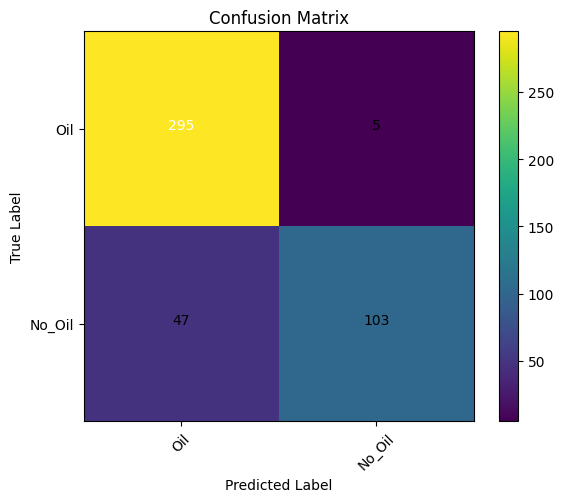

In [37]:
import matplotlib.pyplot as plt
plot_confusion_matrix(
    cm,
    class_names=["Oil","No_Oil"],
    normalize=False
)

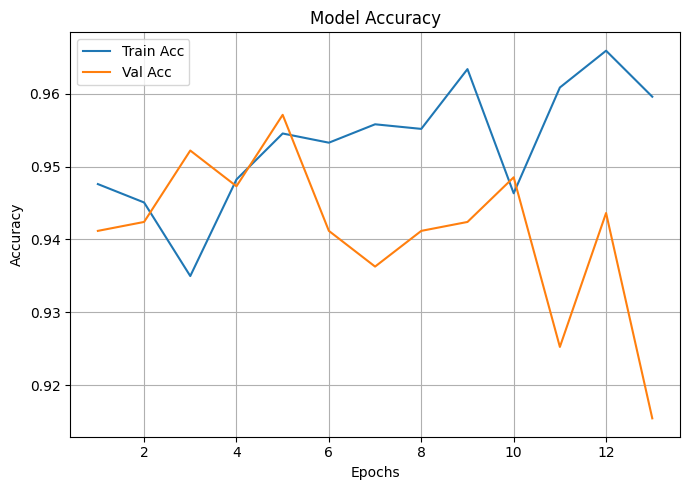

In [38]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

epochs = range(1, len(train_acc) + 1)

plt.figure(figsize=(7, 5))
plt.plot(epochs, train_acc, label='Train Acc')
plt.plot(epochs, val_acc, label='Val Acc')

plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

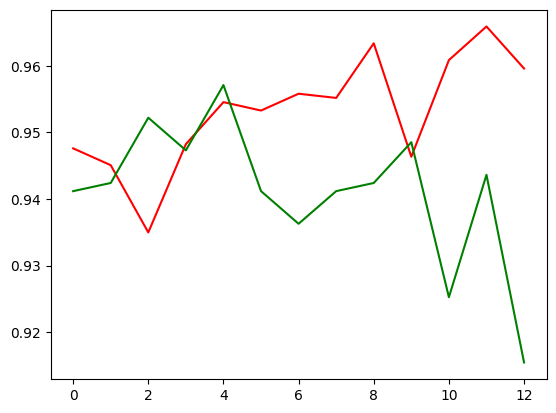

In [39]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], color="red")
plt.plot(history.history['val_accuracy'], color="green")
plt.show()

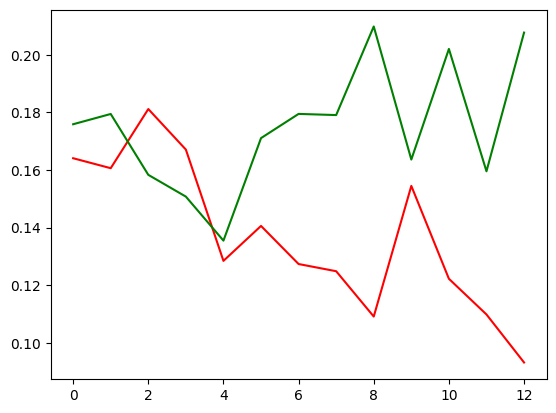

In [40]:
plt.plot(history.history['loss'], color="red")
plt.plot(history.history['val_loss'], color="green")
plt.show()

In [41]:
import numpy as np
import matplotlib.pyplot as plt

def plot_random_combined_sar(model, test_ds, class_names, n=15, max_batches=30):
    images, labels = [], []

    for batch_x, batch_y in test_ds.take(max_batches):
        images.append(batch_x.numpy())
        labels.append(batch_y.numpy())

    images = np.concatenate(images, axis=0)
    labels = np.concatenate(labels, axis=0)

    idxs = np.random.choice(len(images), size=n, replace=False)

    preds = model.predict(images[idxs], verbose=0)

    if preds.shape[-1] == 1:
        y_pred = (preds > 0.5).astype(int).flatten()
        confidences = preds.flatten()
    else:
        y_pred = np.argmax(preds, axis=1)
        confidences = np.max(preds, axis=1)

    if len(labels.shape) > 1:
        y_true = np.argmax(labels[idxs], axis=1)
    else:
        y_true = labels[idxs]

    plt.figure(figsize=(12, 20))

    for i, idx in enumerate(idxs):
        oil_img = images[idx]
        combined = 0.3*oil_img[..., 0] + 0.7*oil_img[..., 1]

        plt.subplot(5, 3, i + 1)
        plt.imshow(combined, cmap="gray")
        plt.axis("off")

        true_label = class_names[y_true[i]]
        pred_label = class_names[y_pred[i]]

        color = "green" if y_true[i] == y_pred[i] else "red"

        plt.title(
            f"T: {true_label} | P: {pred_label} ({confidences[i]:.2f})",
            color=color,
            fontsize=10
        )

    plt.tight_layout()
    plt.show()

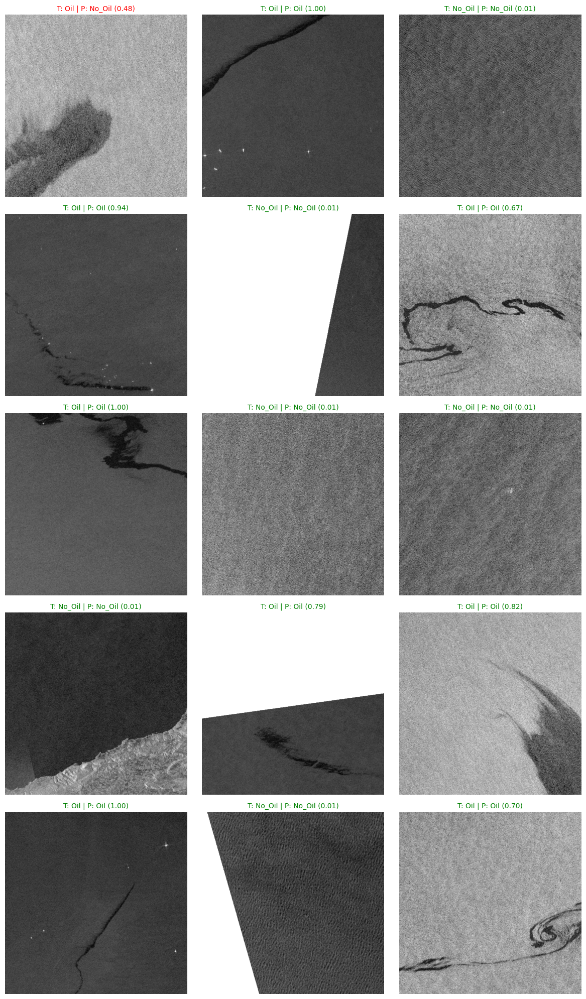

In [45]:
class_names = ["No_Oil","Oil"]

plot_random_combined_sar(
    model,
    test_ds,
    class_names,
    n=15
)

In [46]:
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

57/57 ━━━━━━━━━━━━━━━━━━━━ 56s 988ms/step - accuracy: 0.8844 - loss: 0.2609
Test Loss: 0.2609
Test Accuracy: 0.8844


In [47]:
val_loss, val_acc = model.evaluate(val_ds)
print(f"Val Loss: {val_loss:.4f}")
print(f"Val Accuracy: {val_acc:.4f}")

  1/102 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - accuracy: 1.0000 - loss: 0.0258

  2/102 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9688 - loss: 0.0709

  3/102 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9653 - loss: 0.0764

  4/102 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - accuracy: 0.9583 - loss: 0.0873

  5/102 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9567 - loss: 0.0928

  6/102 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - accuracy: 0.9569 - loss: 0.0944

  7/102 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9580 - loss: 0.0939

  8/102 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9593 - loss: 0.0921

  9/102 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - accuracy: 0.9608 - loss: 0.0898

 10/102 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - accuracy: 0.9622 - loss: 0.0883

 11/102 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - accuracy: 0.9636 - loss: 0.0873

 12/102 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - accuracy: 0.9649 - loss: 0.0861

 13/102 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - accuracy: 0.9661 - loss: 0.0851

 14/102 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - accuracy: 0.9672 - loss: 0.0840

 15/102 ━━━━━━━━━━━━━━━━━━━━ 2:58 2s/step - accuracy: 0.9678 - loss: 0.0859

 16/102 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - accuracy: 0.9683 - loss: 0.0876

 17/102 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - accuracy: 0.9689 - loss: 0.0889

 18/102 ━━━━━━━━━━━━━━━━━━━━ 2:49 2s/step - accuracy: 0.9694 - loss: 0.0901

 19/102 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - accuracy: 0.9700 - loss: 0.0912

 20/102 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - accuracy: 0.9703 - loss: 0.0948

 21/102 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - accuracy: 0.9705 - loss: 0.0980

 22/102 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - accuracy: 0.9708 - loss: 0.1007

 23/102 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - accuracy: 0.9712 - loss: 0.1029

 24/102 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - accuracy: 0.9715 - loss: 0.1048

 25/102 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - accuracy: 0.9718 - loss: 0.1062

 26/102 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - accuracy: 0.9718 - loss: 0.1082

 27/102 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - accuracy: 0.9718 - loss: 0.1098

 28/102 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - accuracy: 0.9716 - loss: 0.1118

 29/102 ━━━━━━━━━━━━━━━━━━━━ 2:23 2s/step - accuracy: 0.9714 - loss: 0.1135

 30/102 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - accuracy: 0.9712 - loss: 0.1150

 31/102 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - accuracy: 0.9711 - loss: 0.1163

 32/102 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - accuracy: 0.9709 - loss: 0.1177

 33/102 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - accuracy: 0.9706 - loss: 0.1192

 34/102 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - accuracy: 0.9703 - loss: 0.1206

 35/102 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - accuracy: 0.9698 - loss: 0.1221

 36/102 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - accuracy: 0.9693 - loss: 0.1236

 37/102 ━━━━━━━━━━━━━━━━━━━━ 2:08 2s/step - accuracy: 0.9689 - loss: 0.1249

 38/102 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - accuracy: 0.9685 - loss: 0.1261

 39/102 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - accuracy: 0.9680 - loss: 0.1272

 40/102 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - accuracy: 0.9677 - loss: 0.1281

 41/102 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - accuracy: 0.9673 - loss: 0.1290

 42/102 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - accuracy: 0.9671 - loss: 0.1297

 43/102 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - accuracy: 0.9668 - loss: 0.1303

 44/102 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - accuracy: 0.9666 - loss: 0.1309

 45/102 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - accuracy: 0.9664 - loss: 0.1313

 46/102 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - accuracy: 0.9663 - loss: 0.1317

 47/102 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - accuracy: 0.9661 - loss: 0.1321

 48/102 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - accuracy: 0.9660 - loss: 0.1324

 49/102 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - accuracy: 0.9658 - loss: 0.1327

 50/102 ━━━━━━━━━━━━━━━━━━━━ 1:44 2s/step - accuracy: 0.9656 - loss: 0.1329

 51/102 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - accuracy: 0.9655 - loss: 0.1331

 52/102 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - accuracy: 0.9653 - loss: 0.1333

 53/102 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - accuracy: 0.9652 - loss: 0.1334

 54/102 ━━━━━━━━━━━━━━━━━━━━ 1:36 2s/step - accuracy: 0.9652 - loss: 0.1335

 55/102 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - accuracy: 0.9651 - loss: 0.1336

 56/102 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - accuracy: 0.9650 - loss: 0.1337

 57/102 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - accuracy: 0.9650 - loss: 0.1337

 58/102 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - accuracy: 0.9649 - loss: 0.1338

 59/102 ━━━━━━━━━━━━━━━━━━━━ 1:26 2s/step - accuracy: 0.9647 - loss: 0.1338

 60/102 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - accuracy: 0.9646 - loss: 0.1339

 61/102 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - accuracy: 0.9644 - loss: 0.1340

 62/102 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - accuracy: 0.9643 - loss: 0.1340

 63/102 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - accuracy: 0.9641 - loss: 0.1341

 64/102 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - accuracy: 0.9640 - loss: 0.1341

 65/102 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - accuracy: 0.9638 - loss: 0.1341

 66/102 ━━━━━━━━━━━━━━━━━━━━ 1:11 2s/step - accuracy: 0.9637 - loss: 0.1340

 67/102 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - accuracy: 0.9636 - loss: 0.1340

 68/102 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - accuracy: 0.9635 - loss: 0.1339

 69/102 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - accuracy: 0.9634 - loss: 0.1339

 70/102 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - accuracy: 0.9633 - loss: 0.1339

 71/102 ━━━━━━━━━━━━━━━━━━━━ 1:01 2s/step - accuracy: 0.9632 - loss: 0.1339

 72/102 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9631 - loss: 0.1339 

 73/102 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.9630 - loss: 0.1339

 74/102 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.9629 - loss: 0.1339

 75/102 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.9627 - loss: 0.1339

 76/102 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - accuracy: 0.9626 - loss: 0.1339

 77/102 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.9625 - loss: 0.1340

 78/102 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.9624 - loss: 0.1340

 79/102 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - accuracy: 0.9623 - loss: 0.1340

 80/102 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.9622 - loss: 0.1340

 81/102 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9621 - loss: 0.1339

 82/102 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.9620 - loss: 0.1339

 83/102 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - accuracy: 0.9619 - loss: 0.1338

 84/102 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.9619 - loss: 0.1339

 85/102 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.9618 - loss: 0.1339

 86/102 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.9617 - loss: 0.1339

 87/102 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.9616 - loss: 0.1339

 88/102 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.9616 - loss: 0.1339

 89/102 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.9615 - loss: 0.1339

 90/102 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9615 - loss: 0.1339

 91/102 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9614 - loss: 0.1339

 92/102 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9614 - loss: 0.1339

 93/102 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9613 - loss: 0.1339

 94/102 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9613 - loss: 0.1339

 95/102 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.9612 - loss: 0.1339

 96/102 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9612 - loss: 0.1340

 97/102 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.9611 - loss: 0.1340 

 98/102 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.9611 - loss: 0.1340

 99/102 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9610 - loss: 0.1341

100/102 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9610 - loss: 0.1341

101/102 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - accuracy: 0.9609 - loss: 0.1341

102/102 ━━━━━━━━━━━━━━━━━━━━ 198s 2s/step - accuracy: 0.9571 - loss: 0.1355
Val Loss: 0.1355
Val Accuracy: 0.9571


In [49]:
pip install pandas

  Using cached pandas-2.3.3-cp310-cp310-win_amd64.whl.metadata (19 kB)
  Using cached pytz-2025.2-py2.py3-none-any.whl.metadata (22 kB)
Using cached pandas-2.3.3-cp310-cp310-win_amd64.whl (11.3 MB)
Using cached pytz-2025.2-py2.py3-none-any.whl (509 kB)

   ---------------------------------------- 0/3 [pytz]
   ---------------------------------------- 0/3 [pytz]
   ---------------------------------------- 0/3 [pytz]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   -------------------------- ------------- 2/3 [pandas]
   -------------------------- ------------- 2/3 [pandas]
   -------------------------- ------------- 2/3 [pandas]
   -------------------------- ------------- 2/3 [pandas]
   -------------------------- ------------- 2/3 [pandas]
   --------

In [50]:

import pandas as pd
import os

df_train = pd.DataFrame({
    "path": train_paths,
    "label": train_labels
})

df_val = pd.DataFrame({
    "path": val_paths,
    "label": val_labels
})

df_train.to_csv("train_dataset.csv", index=False)
df_val.to_csv("val_dataset.csv", index=False)

In [ ]:
import pandas as pd

train_df = pd.read_csv("train_dataset.csv")
val_df = pd.read_csv("val_dataset.csv")

train_paths = train_df["path"].values
train_labels = train_df["label"].values